# Construction d'un modèle de scoring

### Sommaire  
Introduction  
1- Préparation et analyse exploratoire des données.  
2- Modélisation  
3- Interprétation des résultats  
4- Interprétabilité des modèles  
Conclusion et perspectives

## Introduction

L'objectif de ce projet est de développer un algorithme de scoring pour aider à décider si un prêt peut être accordé à un client. La problématique (Le client peut rembourser ou non son prêt?) peut être considérée comme une classification binaire entre 0 et 1. Pour ce faire, il y a eu recours au jeu de données <i>Home Credit</i> disponible sur <i>Kaggle</i>. Ainsi, un kernel a été adopté pour la préparation de données. Pour faire la distinction du travail personnel, le travail adapté est présenté en anglais.

## A- Préparation et analyse exploratoire de données
La première étape d'un projet data consiste à analyser et comprendre les données. Cette étape est cruciale 
pour améliorer la qualité des données en complétant les valeurs manquantes, sélectionnant seulement les variables 
pertinentes à l'étude ou encore créant de nouvelles variables pertinentes à partir de celles dont on dispose.


### - Imports

We are using a typical data science stack: `numpy`, `pandas`, `sklearn`, `matplotlib`. 

In [297]:
# Initialisation: import des librairies
# numpy and pandas for data manipulation
import numpy as np
import pandas as pd 

# sklearn preprocessing for dealing with categorical variables
from sklearn.preprocessing import LabelEncoder

# File system manangement
import os

# Suppress warnings 
import warnings
warnings.filterwarnings('ignore')

# matplotlib and seaborn for plotting
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import GridSearchCV

### - Read in Data 

First, we can list all the available data files. There are a total of 9 files: 1 main file for training (with target) 1 main file for testing (without the target), 1 example submission file, and 6 other files containing additional information about each loan. 

In [2]:
# List files available
print(os.listdir("./input/"))

['application_test.csv', 'HomeCredit_columns_description.csv', 'POS_CASH_balance.csv', 'credit_card_balance.csv', 'installments_payments.csv', 'application_train.csv', 'bureau.csv', 'previous_application.csv', 'bureau_balance.csv', 'sample_submission.csv']


In [3]:
# Training data
app_train = pd.read_csv('./input/application_train.csv')
print('Training data shape: ', app_train.shape)
app_train.head()

Training data shape:  (307511, 122)


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


The training data has 307511 observations (each one a separate loan) and 122 features (variables) including the `TARGET` (the label we want to predict).

### - Exploratory Data Analysis


### * Examine the Distribution of the Target Column

The target is what we are asked to predict: either a 0 for the loan was repaid on time, or a 1 indicating the client had payment difficulties. We can first examine the number of loans falling into each category.

In [5]:
app_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

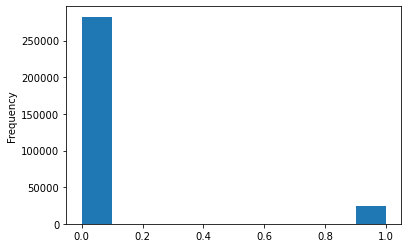

In [6]:
app_train['TARGET'].astype(int).plot.hist();

From this information, we see this is an [_imbalanced class problem_](http://www.chioka.in/class-imbalance-problem/). There are far more loans that were repaid on time than loans that were not repaid. Once we get into more sophisticated machine learning models, we can [weight the classes](http://xgboost.readthedocs.io/en/latest/parameter.html) by their representation in the data to reflect this imbalance. 

### * Examine Missing Values

Next we can look at the number and percentage of missing values in each column. 

In [7]:
# Function to calculate missing values by column# Funct 
def missing_values_table(df):
        # Total missing values
        mis_val = df.isnull().sum()
        
        # Percentage of missing values
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        
        # Make a table with the results
        mis_val_table = pd.concat([mis_val, mis_val_percent], axis=1)
        
        # Rename the columns
        mis_val_table_ren_columns = mis_val_table.rename(
        columns = {0 : 'Missing Values', 1 : '% of Total Values'})
        
        # Sort the table by percentage of missing descending
        mis_val_table_ren_columns = mis_val_table_ren_columns[
            mis_val_table_ren_columns.iloc[:,1] != 0].sort_values(
        '% of Total Values', ascending=False).round(1)
        
        # Print some summary information
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns.\n"      
            "There are " + str(mis_val_table_ren_columns.shape[0]) +
              " columns that have missing values.")
        
        # Return the dataframe with missing information
        return mis_val_table_ren_columns

In [8]:
# Missing values statistics
missing_values = missing_values_table(app_train)
missing_values.head(20)

Your selected dataframe has 122 columns.
There are 67 columns that have missing values.


,Missing Values,% of Total Values
COMMONAREA_MEDI,214865,69.9
COMMONAREA_AVG,214865,69.9
COMMONAREA_MODE,214865,69.9
NONLIVINGAPARTMENTS_MEDI,213514,69.4
NONLIVINGAPARTMENTS_MODE,213514,69.4
NONLIVINGAPARTMENTS_AVG,213514,69.4
FONDKAPREMONT_MODE,210295,68.4
LIVINGAPARTMENTS_MODE,210199,68.4
LIVINGAPARTMENTS_MEDI,210199,68.4
LIVINGAPARTMENTS_AVG,210199,68.4


When it comes time to build our machine learning models, we will have to fill in these missing values (known as imputation). 

### * Column Types

Let's look at the number of columns of each data type. `int64` and `float64` are numeric variables ([which can be either discrete or continuous](https://stats.stackexchange.com/questions/206/what-is-the-difference-between-discrete-data-and-continuous-data)). `object` columns contain strings and are  [categorical features.](http://support.minitab.com/en-us/minitab-express/1/help-and-how-to/modeling-statistics/regression/supporting-topics/basics/what-are-categorical-discrete-and-continuous-variables/) . 

In [9]:
# Number of each type of column
app_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

Let's now look at the number of unique entries in each of the `object` (categorical) columns.

In [10]:
# Number of unique classes in each object column
app_train.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

Most of the categorical variables have a relatively small number of unique entries. We will need to find a way to deal with these categorical variables! 

### * Encoding Categorical Variables

Before we go any further, we need to deal with pesky categorical variables.  A machine learning model unfortunately cannot deal with categorical variables (except for some models such as [LightGBM](http://lightgbm.readthedocs.io/en/latest/Features.html)). Therefore, we have to find a way to encode (represent) these variables as numbers before handing them off to the model. There are two main ways to carry out this process:

* Label encoding: assign each unique category in a categorical variable with an integer. No new columns are created. An example is shown below

![image](https://raw.githubusercontent.com/WillKoehrsen/Machine-Learning-Projects/master/label_encoding.png)

* One-hot encoding: create a new column for each unique category in a categorical variable. Each observation recieves a 1 in the column for its corresponding category and a 0 in all other new columns. 

![image](https://raw.githubusercontent.com/WillKoehrsen/Machine-Learning-Projects/master/one_hot_encoding.png)


In this notebook, we will use Label Encoding for any categorical variables with only 2 categories and One-Hot Encoding for any categorical variables with more than 2 categories. This process may need to change as we get further into the project, but for now, we will see where this gets us. (We will also not use any dimensionality reduction in this notebook but will explore in future iterations).

### * Label Encoding and One-Hot Encoding

Let's implement the policy described above: for any categorical variable (`dtype == object`) with 2 unique categories, we will use label encoding, and for any categorical variable with more than 2 unique categories, we will use one-hot encoding. 

For label encoding, we use the Scikit-Learn `LabelEncoder` and for one-hot encoding, the pandas `get_dummies(df)` function.

In [11]:
# Create a label encoder object
le = LabelEncoder()
le_count = 0

# Iterate through the columns
for col in app_train:
    if app_train[col].dtype == 'object':
        # If 2 or fewer unique categories
        if len(list(app_train[col].unique())) <= 2:
            # Train on the training data
            le.fit(app_train[col])
            # Transform both training and testing data
            app_train[col] = le.transform(app_train[col])
            app_test[col] = le.transform(app_test[col])
            
            # Keep track of how many columns were label encoded
            le_count += 1
            
print('%d columns were label encoded.' % le_count)

3 columns were label encoded.


In [298]:
# one-hot encoding of categorical variables
app_train = pd.get_dummies(app_train)
print('Training Features shape: ', app_train.shape)

Training Features shape:  (307511, 241)


### * Aligning Training and Testing Data

Cette étape est non nécessaire car nous n'allons pas utiliser la base de test de la compétition puisqu'elle ne contient pas la target. 

### - Back to Exploratory Data Analysis

### * Anomalies

One problem we always want to be on the lookout for when doing EDA is anomalies within the data. These may be due to mis-typed numbers, errors in measuring equipment, or they could be valid but extreme measurements. One way to support anomalies quantitatively is by looking at the statistics of a column using the `describe` method. The numbers in the `DAYS_BIRTH` column are negative because they are recorded relative to the current loan application. To see these stats in years, we can mutliple by -1 and divide by the number of days in a year:



In [14]:
(app_train['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

Those ages look reasonable. There are no outliers for the age on either the high or low end. How about the days of employment? 

In [15]:
app_train['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

That doesn't look right! The maximum value (besides being positive) is about 1000 years! 

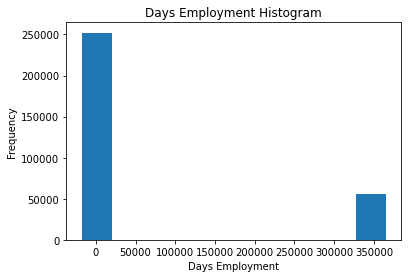

In [16]:
app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

Just out of curiousity, let's subset the anomalous clients and see if they tend to have higher or low rates of default than the rest of the clients.

In [17]:
anom = app_train[app_train['DAYS_EMPLOYED'] == 365243]
non_anom = app_train[app_train['DAYS_EMPLOYED'] != 365243]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous days of employment' % len(anom))

The non-anomalies default on 8.66% of loans
The anomalies default on 5.40% of loans
There are 55374 anomalous days of employment


Well that is extremely interesting! It turns out that the anomalies have a lower rate of default. 

Handling the anomalies depends on the exact situation, with no set rules. One of the safest approaches is just to set the anomalies to a missing value and then have them filled in (using Imputation) before machine learning. In this case, since all the anomalies have the exact same value, we want to fill them in with the same value in case all of these loans share something in common. The anomalous values seem to have some importance, so we want to tell the machine learning model if we did in fact fill in these values. As a solution, we will fill in the anomalous values with not a number (`np.nan`) and then create a new boolean column indicating whether or not the value was anomalous.



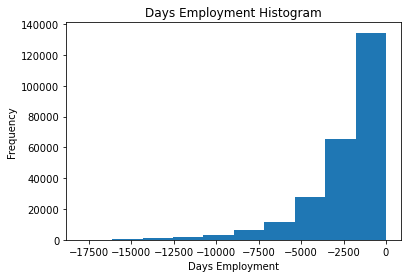

In [18]:
# Create an anomalous flag column
app_train['DAYS_EMPLOYED_ANOM'] = app_train["DAYS_EMPLOYED"] == 365243

# Replace the anomalous values with nan
app_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

app_train['DAYS_EMPLOYED'].plot.hist(title = 'Days Employment Histogram');
plt.xlabel('Days Employment');

The distribution looks to be much more in line with what we would expect, and we also have created a new column to tell the model that these values were originally anomalous (becuase we will have to fill in the nans with some value, probably the median of the column). The other columns with `DAYS` in the dataframe look to be about what we expect with no obvious outliers. 

### Correlations

Now that we have dealt with the categorical variables and the outliers, let's continue with the EDA. One way to try and understand the data is by looking for correlations between the features and the target. We can calculate the Pearson correlation coefficient between every variable and the target using the `.corr` dataframe method.

The correlation coefficient is not the greatest method to represent "relevance" of a feature, but it does give us an idea of possible relationships within the data. Some [general interpretations of the absolute value of the correlation coefficent](http://www.statstutor.ac.uk/resources/uploaded/pearsons.pdf) are:


* .00-.19 “very weak”
*  .20-.39 “weak”
*  .40-.59 “moderate”
*  .60-.79 “strong”
* .80-1.0 “very strong”


In [20]:
# Find correlations with the target and sort
correlations = app_train.corr()['TARGET'].sort_values()

# Display correlations
print('Most Positive Correlations:\n', correlations.tail(15))
print('\nMost Negative Correlations:\n', correlations.head(15))

Most Positive Correlations:
 OCCUPATION_TYPE_Laborers                             0.043019
FLAG_DOCUMENT_3                                      0.044346
REG_CITY_NOT_LIVE_CITY                               0.044395
FLAG_EMP_PHONE                                       0.045982
NAME_EDUCATION_TYPE_Secondary / secondary special    0.049824
REG_CITY_NOT_WORK_CITY                               0.050994
DAYS_ID_PUBLISH                                      0.051457
CODE_GENDER_M                                        0.054713
DAYS_LAST_PHONE_CHANGE                               0.055218
NAME_INCOME_TYPE_Working                             0.057481
REGION_RATING_CLIENT                                 0.058899
REGION_RATING_CLIENT_W_CITY                          0.060893
DAYS_EMPLOYED                                        0.074958
DAYS_BIRTH                                           0.078239
TARGET                                               1.000000
Name: TARGET, dtype: float64

Most Negati

Let's take a look at some of more significant correlations: the `DAYS_BIRTH` is the most positive correlation. (except for `TARGET` because the correlation of a variable with itself is always 1!) Looking at the documentation, `DAYS_BIRTH` is the age in days of the client at the time of the loan in negative days (for whatever reason!). The correlation is positive, but the value of this feature is actually negative, meaning that as the client gets older, they are less likely to default on their loan (ie the target == 0). That's a little confusing, so we will take the absolute value of the feature and then the correlation will be negative.

### Effect of Age on Repayment

In [21]:
# Find the correlation of the positive days since birth and target
app_train['DAYS_BIRTH'] = abs(app_train['DAYS_BIRTH'])
app_train['DAYS_BIRTH'].corr(app_train['TARGET'])

-0.07823930830982712

As the client gets older, there is a negative linear relationship with the target meaning that as clients get older, they tend to repay their loans on time more often. 

Let's start looking at this variable. First, we can make a histogram of the age. We will put the x axis in years to make the plot a little more understandable.

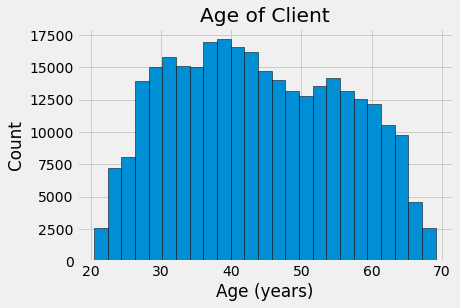

In [22]:
# Set the style of plots
plt.style.use('fivethirtyeight')

# Plot the distribution of ages in years
plt.hist(app_train['DAYS_BIRTH'] / 365, edgecolor = 'k', bins = 25)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');

By itself, the distribution of age does not tell us much other than that there are no outliers as all the ages are reasonable. To visualize the effect of the age on the target, we will next make a [kernel density estimation plot](https://en.wikipedia.org/wiki/Kernel_density_estimation) (KDE) colored by the value of the target. A [kernel density estimate plot shows the distribution of a single variable](https://chemicalstatistician.wordpress.com/2013/06/09/exploratory-data-analysis-kernel-density-estimation-in-r-on-ozone-pollution-data-in-new-york-and-ozonopolis/) and can be thought of as a smoothed histogram (it is created by computing a kernel, usually a Gaussian, at each data point and then averaging all the individual kernels to develop a single smooth curve). We will use the seaborn `kdeplot` for this graph.

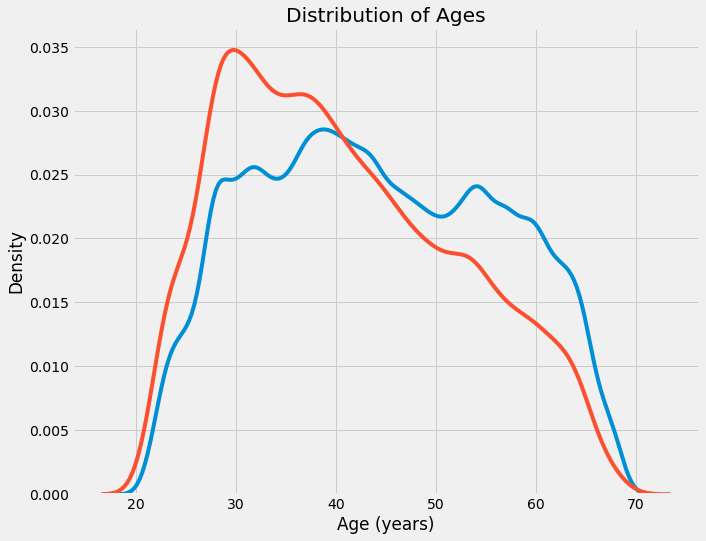

In [23]:
plt.figure(figsize = (10, 8))

# KDE plot of loans that were repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, 'DAYS_BIRTH'] / 365, label = 'target == 0')

# KDE plot of loans which were not repaid on time
sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, 'DAYS_BIRTH'] / 365, label = 'target == 1')

# Labeling of plot
plt.xlabel('Age (years)'); plt.ylabel('Density'); plt.title('Distribution of Ages');

The target == 1 curve skews towards the younger end of the range. Although this is not a significant correlation (-0.07 correlation coefficient), this variable is likely going to be useful in a machine learning model because it does affect the target. Let's look at this relationship in another way: average failure to repay loans by age bracket. 

To make this graph, first we `cut` the age category into bins of 5 years each. Then, for each bin, we calculate the average value of the target, which tells us the ratio of loans that were not repaid in each age category.

In [24]:
# Age information into a separate dataframe
age_data = app_train[['TARGET', 'DAYS_BIRTH']]
age_data['YEARS_BIRTH'] = age_data['DAYS_BIRTH'] / 365

# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['YEARS_BIRTH'], bins = np.linspace(20, 70, num = 11))
age_data.head(10)

,TARGET,DAYS_BIRTH,YEARS_BIRTH,YEARS_BINNED
0,1,9461,25.920548,"(25.0, 30.0]"
1,0,16765,45.931507,"(45.0, 50.0]"
2,0,19046,52.180822,"(50.0, 55.0]"
3,0,19005,52.068493,"(50.0, 55.0]"
4,0,19932,54.608219,"(50.0, 55.0]"
5,0,16941,46.413699,"(45.0, 50.0]"
6,0,13778,37.747945,"(35.0, 40.0]"
7,0,18850,51.643836,"(50.0, 55.0]"
8,0,20099,55.065753,"(55.0, 60.0]"
9,0,14469,39.641096,"(35.0, 40.0]"


In [25]:
# Group by the bin and calculate averages
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,YEARS_BIRTH
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,8532.795625,23.377522
"(25.0, 30.0]",0.111436,10155.219250,27.822518
"(30.0, 35.0]",0.102814,11854.848377,32.479037
"(35.0, 40.0]",0.089414,13707.908253,37.555913
"(40.0, 45.0]",0.078491,15497.661233,42.459346
"(45.0, 50.0]",0.074171,17323.900441,47.462741
"(50.0, 55.0]",0.066968,19196.494791,52.593136
"(55.0, 60.0]",0.055314,20984.262742,57.491131
"(60.0, 65.0]",0.052737,22780.547460,62.412459


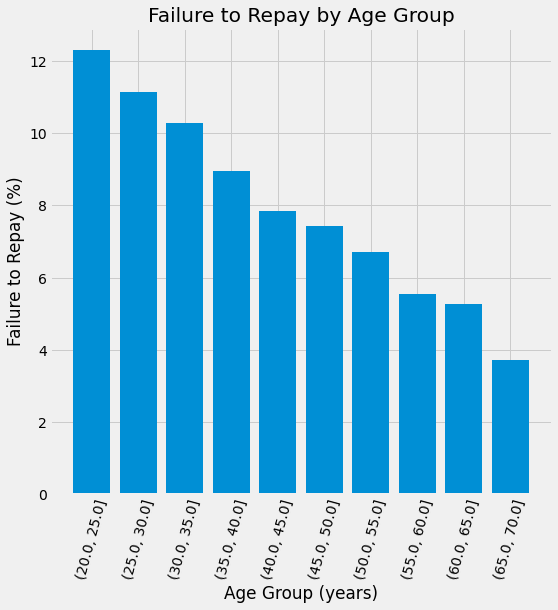

In [26]:
plt.figure(figsize = (8, 8))

# Graph the age bins and the average of the target as a bar plot
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Age Group (years)'); plt.ylabel('Failure to Repay (%)')
plt.title('Failure to Repay by Age Group');

There is a clear trend: younger applicants are more likely to not repay the loan! The rate of failure to repay is above 10% for the youngest three age groups and beolow 5% for the oldest age group.

This is information that could be directly used by the bank: because younger clients are less likely to repay the loan, maybe they should be provided with more guidance or financial planning tips. This does not mean the bank should discriminate against younger clients, but it would be smart to take precautionary measures to help younger clients pay on time.

### * Exterior Sources

The 3 variables with the strongest negative correlations with the target are `EXT_SOURCE_1`, `EXT_SOURCE_2`, and `EXT_SOURCE_3`.
According to the documentation, these features represent a "normalized score from external data source". I'm not sure what this exactly means, but it may be a cumulative sort of credit rating made using numerous sources of data. 

Let's take a look at these variables.

First, we can show the correlations of the `EXT_SOURCE` features with the target and with each other.

In [27]:
# Extract the EXT_SOURCE variables and show correlations
ext_data = app_train[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,DAYS_BIRTH
TARGET,1.000000,-0.155317,-0.160472,-0.178919,-0.078239
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186846,0.600610
EXT_SOURCE_2,-0.160472,0.213982,1.000000,0.109167,0.091996
EXT_SOURCE_3,-0.178919,0.186846,0.109167,1.000000,0.205478
DAYS_BIRTH,-0.078239,0.600610,0.091996,0.205478,1.000000


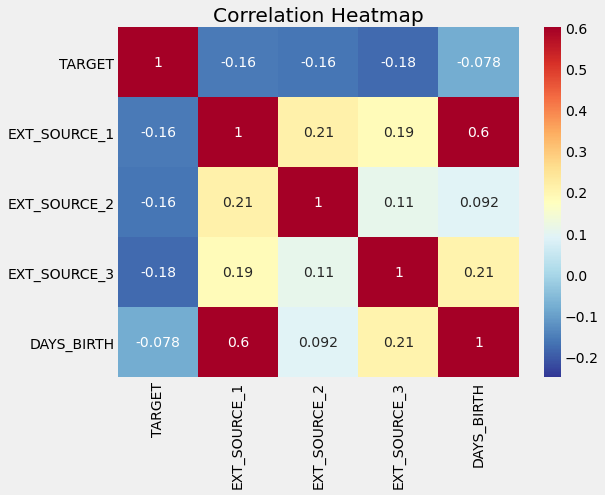

In [28]:
plt.figure(figsize = (8, 6))

# Heatmap of correlations
sns.heatmap(ext_data_corrs, cmap = plt.cm.RdYlBu_r, vmin = -0.25, annot = True, vmax = 0.6)
plt.title('Correlation Heatmap');

All three `EXT_SOURCE` features have negative correlations with the target, indicating that as the value of the `EXT_SOURCE` increases, the client is more likely to repay the loan. We can also see that `DAYS_BIRTH` is positively correlated with `EXT_SOURCE_1` indicating that maybe one of the factors in this score is the client age.

Next we can look at the distribution of each of these features colored by the value of the target. This will let us visualize the effect of this variable on the target.

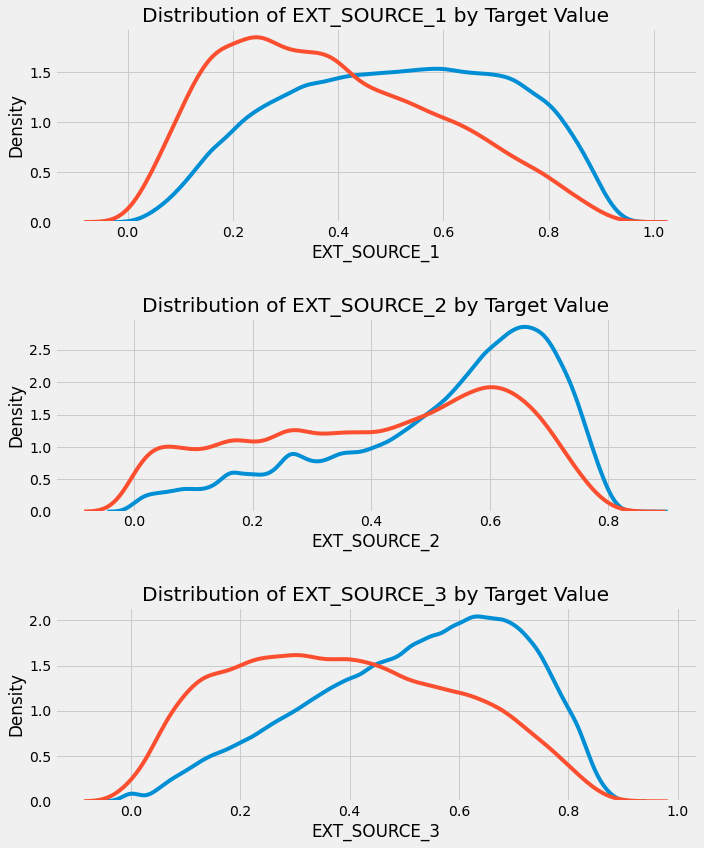

In [29]:
plt.figure(figsize = (10, 12))

# iterate through the sources
for i, source in enumerate(['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']):
    
    # create a new subplot for each source
    plt.subplot(3, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 0, source], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train.loc[app_train['TARGET'] == 1, source], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % source)
    plt.xlabel('%s' % source); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)
    

`EXT_SOURCE_3` displays the greatest difference between the values of the target. We can clearly see that this feature has some relationship to the likelihood of an applicant to repay a loan. The relationship is not very strong (in fact they are all [considered very weak](http://www.statstutor.ac.uk/resources/uploaded/pearsons.pdf), but these variables will still be useful for a machine learning model to predict whether or not an applicant will repay a loan on time.

# Feature Engineering

Kaggle competitions are won by feature engineering: those win are those who can create the most useful features out of the data. (This is true for the most part as the winning models, at least for structured data, all tend to be variants on [gradient boosting](http://blog.kaggle.com/2017/01/23/a-kaggle-master-explains-gradient-boosting/)). This represents one of the patterns in machine learning: feature engineering has a greater return on investment than model building and hyperparameter tuning. [This is a great article on the subject)](https://www.featurelabs.com/blog/secret-to-data-science-success/). As Andrew Ng is fond of saying: "applied machine learning is basically feature engineering." 

While choosing the right model and optimal settings are important, the model can only learn from the data it is given. Making sure this data is as relevant to the task as possible is the job of the data scientist (and maybe some [automated tools](https://docs.featuretools.com/getting_started/install.html) to help us out).

Feature engineering refers to a geneal process and can involve both feature construction: adding new features from the existing data, and feature selection: choosing only the most important features or other methods of dimensionality reduction. There are many techniques we can use to both create features and select features.

We will do a lot of feature engineering when we start using the other data sources, but in this notebook we will try only two simple feature construction methods: 

* Polynomial features
* Domain knowledge features


## Polynomial Features

One simple feature construction method is called [polynomial features](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html). In this method, we make features that are powers of existing features as well as interaction terms between existing features. For example, we can create variables `EXT_SOURCE_1^2` and `EXT_SOURCE_2^2` and also variables such as `EXT_SOURCE_1` x `EXT_SOURCE_2`, `EXT_SOURCE_1` x `EXT_SOURCE_2^2`, `EXT_SOURCE_1^2` x   `EXT_SOURCE_2^2`, and so on. These features that are a combination of multiple individual variables are called [interaction terms](https://en.wikipedia.org/wiki/Interaction_(statistics) because they  capture the interactions between variables. In other words, while two variables by themselves  may not have a strong influence on the target, combining them together into a single interaction variable might show a relationship with the target. [Interaction terms are commonly used in statistical models](https://www.theanalysisfactor.com/interpreting-interactions-in-regression/) to capture the effects of multiple variables, but I do not see them used as often in machine learning. Nonetheless, we can try out a few to see if they might help our model to predict whether or not a client will repay a loan. 

Jake VanderPlas writes about [polynomial features in his excellent book Python for Data Science](https://jakevdp.github.io/PythonDataScienceHandbook/05.04-feature-engineering.html) for those who want more information.

In the following code, we create polynomial features using the `EXT_SOURCE` variables and the `DAYS_BIRTH` variable. [Scikit-Learn has a useful class called `PolynomialFeatures`](http://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.PolynomialFeatures.html) that creates the polynomials and the interaction terms up to a specified degree. We can use a degree of 3 to see the results (when we are creating polynomial features, we want to avoid using too high of a degree, both because the number of features scales exponentially with the degree, and because we can run into [problems with overfitting](http://scikit-learn.org/stable/auto_examples/model_selection/plot_underfitting_overfitting.html#sphx-glr-auto-examples-model-selection-plot-underfitting-overfitting-py)). 

In [31]:
# Make a new dataframe for polynomial features
poly_features = app_train[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH', 'TARGET']]

from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy='median')



poly_target = poly_features['TARGET']

poly_features = poly_features.drop(columns = ['TARGET'])

# Need to impute missing values
poly_features = imputer.fit_transform(poly_features)

from sklearn.preprocessing import PolynomialFeatures
                                  
# Create the polynomial object with specified degree
poly_transformer = PolynomialFeatures(degree = 3)

In [32]:
# Train the polynomial features
poly_transformer.fit(poly_features)

# Transform the features
poly_features = poly_transformer.transform(poly_features)
print('Polynomial Features shape: ', poly_features.shape)

Polynomial Features shape:  (307511, 35)


This creates a considerable number of new features. To get the names we have to use the polynomial features `get_feature_names` method.

In [33]:
poly_transformer.get_feature_names(input_features = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'DAYS_BIRTH'])[:15]

['1',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'DAYS_BIRTH',
 'EXT_SOURCE_1^2',
 'EXT_SOURCE_1 EXT_SOURCE_2',
 'EXT_SOURCE_1 EXT_SOURCE_3',
 'EXT_SOURCE_1 DAYS_BIRTH',
 'EXT_SOURCE_2^2',
 'EXT_SOURCE_2 EXT_SOURCE_3',
 'EXT_SOURCE_2 DAYS_BIRTH',
 'EXT_SOURCE_3^2',
 'EXT_SOURCE_3 DAYS_BIRTH',
 'DAYS_BIRTH^2']

There are 35 features with individual features raised to powers up to degree 3 and interaction terms. Now, we can see whether any of these new features are correlated with the target.

In [34]:
# Create a dataframe of the features 
poly_features = pd.DataFrame(poly_features, 
                             columns = poly_transformer.get_feature_names(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                           'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Add in the target
poly_features['TARGET'] = poly_target

# Find the correlations with the target
poly_corrs = poly_features.corr()['TARGET'].sort_values()

# Display most negative and most positive
print(poly_corrs.head(10))
print(poly_corrs.tail(5))

EXT_SOURCE_2 EXT_SOURCE_3                -0.193939
EXT_SOURCE_1 EXT_SOURCE_2 EXT_SOURCE_3   -0.189605
EXT_SOURCE_2 EXT_SOURCE_3 DAYS_BIRTH     -0.181283
EXT_SOURCE_2^2 EXT_SOURCE_3              -0.176428
EXT_SOURCE_2 EXT_SOURCE_3^2              -0.172282
EXT_SOURCE_1 EXT_SOURCE_2                -0.166625
EXT_SOURCE_1 EXT_SOURCE_3                -0.164065
EXT_SOURCE_2                             -0.160295
EXT_SOURCE_2 DAYS_BIRTH                  -0.156873
EXT_SOURCE_1 EXT_SOURCE_2^2              -0.156867
Name: TARGET, dtype: float64
DAYS_BIRTH     -0.078239
DAYS_BIRTH^2   -0.076672
DAYS_BIRTH^3   -0.074273
TARGET          1.000000
1                    NaN
Name: TARGET, dtype: float64


Several of the new variables have a greater (in terms of absolute magnitude) correlation with the target than the original features. When we build machine learning models, we can try with and without these features to determine if they actually help the model learn. 

We will add these features to a copy of the training and testing data and then evaluate models with and without the features. Many times in machine learning, the only way to know if an approach will work is to try it out! 

In [35]:
# Put test features into dataframe
poly_features_test = pd.DataFrame(poly_features_test, 
                                  columns = poly_transformer.get_feature_names(['EXT_SOURCE_1', 'EXT_SOURCE_2', 
                                                                                'EXT_SOURCE_3', 'DAYS_BIRTH']))

# Merge polynomial features into training dataframe
poly_features['SK_ID_CURR'] = app_train['SK_ID_CURR']
app_train_poly = app_train.merge(poly_features, on = 'SK_ID_CURR', how = 'left')

# Print out the new shapes
print('Training data with polynomial features shape: ', app_train_poly.shape)

Training data with polynomial features shape:  (307511, 275)
Testing data with polynomial features shape:   (48744, 275)


## Domain Knowledge Features

Maybe it's not entirely correct to call this "domain knowledge" because I'm not a credit expert, but perhaps we could call this "attempts at applying limited financial knowledge". In this frame of mind, we can make a couple features that attempt to capture what we think may be important for telling whether a client will default on a loan. Here I'm going to use five features that were inspired by [this script](https://www.kaggle.com/jsaguiar/updated-0-792-lb-lightgbm-with-simple-features) by Aguiar:

* `CREDIT_INCOME_PERCENT`: the percentage of the credit amount relative to a client's income
* `ANNUITY_INCOME_PERCENT`: the percentage of the loan annuity relative to a client's income
* `CREDIT_TERM`:  the length of the payment in months (since the annuity is the monthly amount due
* `DAYS_EMPLOYED_PERCENT`: the percentage of the days employed relative to the client's age

Again, thanks to Aguiar and [his great script](https://www.kaggle.com/jsaguiar/updated-0-792-lb-lightgbm-with-simple-features) for exploring these features.



In [36]:
app_train_domain = app_train.copy()
app_test_domain = app_test.copy()

app_train_domain['CREDIT_INCOME_PERCENT'] = app_train_domain['AMT_CREDIT'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['ANNUITY_INCOME_PERCENT'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_INCOME_TOTAL']
app_train_domain['CREDIT_TERM'] = app_train_domain['AMT_ANNUITY'] / app_train_domain['AMT_CREDIT']
app_train_domain['DAYS_EMPLOYED_PERCENT'] = app_train_domain['DAYS_EMPLOYED'] / app_train_domain['DAYS_BIRTH']

#### Visualize New Variables

We should explore these __domain knowledge__ variables visually in a graph. For all of these, we will make the same KDE plot colored by the value of the `TARGET`.

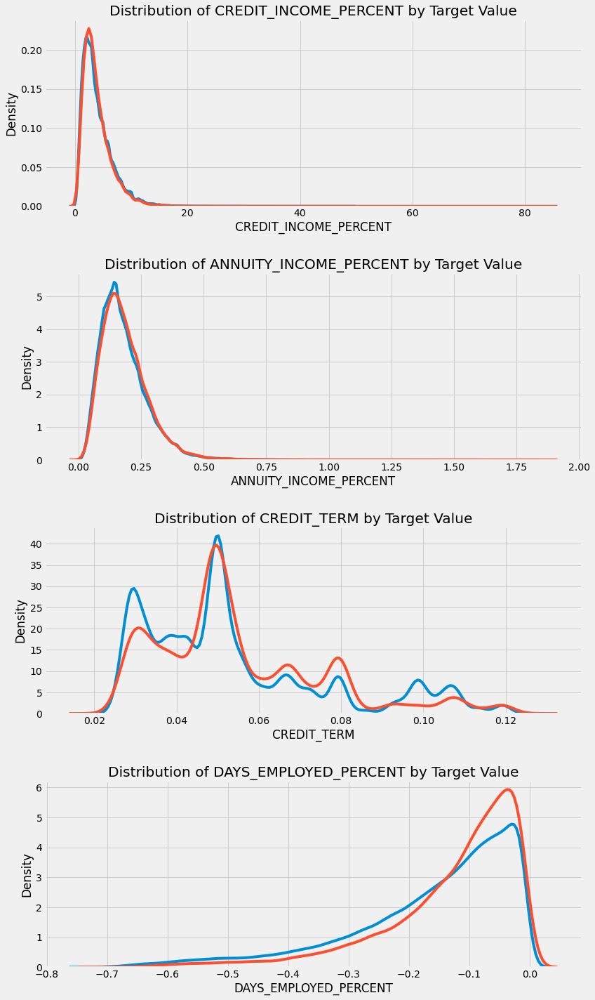

In [38]:
plt.figure(figsize = (12, 20))
# iterate through the new features
for i, feature in enumerate(['CREDIT_INCOME_PERCENT', 'ANNUITY_INCOME_PERCENT', 'CREDIT_TERM', 'DAYS_EMPLOYED_PERCENT']):
    
    # create a new subplot for each source
    plt.subplot(4, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(app_train_domain.loc[app_train_domain['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

It's hard to say ahead of time if these new features will be useful. The only way to tell for sure is to try them out! 


### Imputation
To get a baseline, we will use all of the features after encoding the categorical variables. We will preprocess the data by filling in the missing values (imputation) and normalizing the range of the features (feature scaling). The following code performs both of these preprocessing steps.

In [39]:
# Si l'autre (A) marche supprimer celle ci

'''  Filling in the missing values (imputation). 
    The following code performs both of these preprocessing steps.
'''


from sklearn.impute import SimpleImputer 


# Drop the target from the training data
if 'TARGET' in app_train:
    train = app_train.drop(columns = ['TARGET'])
else:
    train = app_train.copy()
    
# Feature names
features = list(train.columns)


# Median imputation of missing values
#imputer = Imputer(strategy = 'median')
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')


# Fit on the training data
imputer.fit(train)

# Transform both training and testing data
train = imputer.transform(train)
#test = imputer.transform(app_test)

In [40]:
#. Si l'autre marche (B) supprimer celle ci
''' Split in X and Y '''
# séparer le train et le test sets
X = train #X = app_train.drop(columns=["TARGET"]) 
y = app_train["TARGET"].values

## On crée un vecteur de prédiction à partir du vecteur de probabilités
#y_class=np.where(y>0.5, 1, 0)

#----> n'a aucune importance c'est soit 1 ou 0 n'a aucun effet c'est la même chose


<B>=================></B> 
Nous pouvons donc à présent passer à la phase de modélisation. Cette phase va consister à tester plusieurs modèles de classification puis les comparer pour n'en retenir que ceux, dans un contexte d'entreprise, seront ensuite déployés en production.   


## B- Entraînement de plusieurs modèles de classification :

Dans cette partie, on entraîne plusieurs modèles de classification : régression logistique, arbre de décision, random forests, xgboost et lightgbm. Pour les comparer, nous faisons le choix d'utiliser <i> initialement</i> la métrique <i><b> f1_score </b></i>. Le F score représente une moyenne harmonique de précision et de rappel. De plus,  on applique le Cross-validation avec GridSearchCV afin de calculer et d'optimiser les hypermaramètres sur les bases de train/test : f1-score, AUC, recall, matrice de confusion. En fait, ceci évite le surapprentissage.

##### Séparer les données en deux bases train/test.

In [41]:
'''Split the dataset in train and test.''' 

from sklearn import model_selection
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y,test_size=0.3 ) # 30% des données dans le jeu de test

print("train size:", len(X_train))

train size: 215257
test size: 92254


In [42]:
'''standardiser les données d’entraînement et appliquer la même transformation aux données de test'''

from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Apply MinMaxScaler (0, 1)   ----- Or .StandardScaler()
scaler = StandardScaler()
#scaler = MinMaxScaler(feature_range = (0, 1))
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


print("X_train:", X_train.shape)
print('X_test: ', X_test.shape)

X_train: (215257, 240)
X_test:  (92254, 240)


In [43]:
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import make_scorer, accuracy_score, recall_score, classification_report, auc , f1_score, precision_score, confusion_matrix, roc_auc_score

In [45]:
# Importation et paramétrage des modèles

from sklearn.linear_model import LogisticRegression
logit = LogisticRegression()
logit_parameters = { 'C':[ 1e-3,1e-2,0.1, 1, 10]}

from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc_parameters = {
    "n_estimators": [10, 30, 50, 100],
    "criterion": ["gini", "entropy"],
    "max_depth": [5, 10, 20],
    #"min_samples_leaf": [50, 100, 200]    
}


from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
dtc_parameters = {
    'criterion':['gini','entropy'],
    'max_depth': np.arange(3, 15)   
}


from xgboost import XGBClassifier
xgb = XGBClassifier()
xgb_parameters = {
     # Parameters that we are going to tune.
    #'max_depth':[3, 5, 7],
    #'min_child_weight':[1, 3, 5]
    'max_depth':[3, 4, 5],
    'min_child_weight':[1, 3, 5]
}

from lightgbm import LGBMClassifier
lgbm = LGBMClassifier()
lgbm_parameters = {
    "n_estimators": [50, 75, 100],
    "boosting_type": ["gbdt", "dart", "goss"],
    "max_depth": [1, 2, 5] 
}

#Utilisée pour la pondération
from sklearn.utils.class_weight import compute_class_weight

### I- Sans Métrique - Cross-validation avec GridSearchCV

Ici, nous utilisons la syntaxe de modélisation familière Scikit-Learn: nous créons d'abord le modèle, puis nous entraînons le modèle en utilisant `.fit` et ensuite nous faisons des prédictions sur les données de test en utilisant` .predict` (nous voulons des probabilités et non un 0 ou 1 pour l'accuracy) et ` .predict_proba`  pour le reste.

In [44]:
#Model function
def modelCV(algorithm, X_train, y_train, X_test, y_test, parameters):
    # Fixer les valeurs des hyperparamètres à tester
    #print(algorithm.get_params().keys())

    # Choisir un score à optimiser, ici f1_score
    score = ['accuracy', 'f1', 'recall', 'roc_auc']

    # Créer un classifieur clf avec recherche d'hyperparamètre par validation croisée
    clf = model_selection.GridSearchCV(
    algorithm, # un classifieur kNN
    parameters,     # hyperparamètres à tester
    cv=5,           # nombre de folds de validation croisée
    refit='f1', # the f1_score is being optimized the other just monitored
    return_train_score=True
    )
    
    # Train on the training data
    # Optimiser ce classifieur sur le jeu d'entraînement
    clf.fit(X_train, y_train)

    # Afficher le(s) hyperparamètre(s) optimaux
    print("Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:")
    print(clf.best_params_)
    
    predictions = clf.predict(X_test) # ceci fonctionne bien pour tout sauf AUC
    # Pour AUC il faut rajouter un truc de probabilité.
    print (algorithm)
    
    acc = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    
    print ("Accuracy score : ", acc)
    print ("F1_Score score : ", f1)
    print ("Recall score   : ", recall)
    
   
    print ("classification report :\n",classification_report(y_test, predictions))
    print ("confusion matrix report :\n",confusion_matrix(y_test, predictions))
    tn, fp, fn, tp = confusion_matrix(y_test, predictions, labels=[0,1]).ravel()

    print ("  tn: {0} fp: {1} , fn: {2} , tp: {3}: ".format(tn, fp, fn, tp) )
    # metrics.confusion_matrix(y_true, y_pred)
    conf_mat = confusion_matrix(y_true=y_test, y_pred=predictions)
    labels = ['Class 0', 'Class 1']
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
    fig.colorbar(cax)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    plt.xlabel('Predicted')
    plt.ylabel('Expected')
    plt.show()
 
    # predict the probabilities of not paying a loan
    prediction_probabilities = clf.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test , prediction_probabilities)
    print ("AUC   : ", auc)
    return (acc, f1, recall, auc, clf.best_params_ , fn, fp)


    

#### I.1 - Logistic Regression

Nous débuterons par la régression logistique qui est le premier modèle de référence lorsqu'on parle de classification binaire. 

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'C': 0.01}
LogisticRegression()
Accuracy score :  0.9192988921889566
F1_Score score :  0.022837642735267092
Recall score   :  0.011704560742634198
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.47      0.01      0.02      7433

    accuracy                           0.92     92254
   macro avg       0.69      0.51      0.49     92254
weighted avg       0.88      0.92      0.88     92254

confusion matrix report :
 [[84722    99]
 [ 7346    87]]
  tn: 84722 fp: 99 , fn: 7346 , tp: 87: 


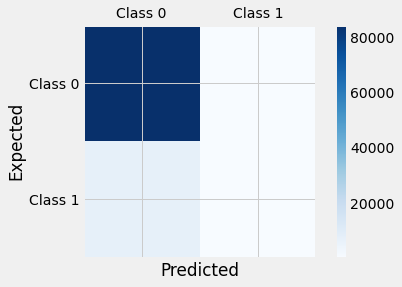

AUC   :  0.746965516018108


In [46]:
acc_11, f1_11, recall_11, auc_11, best_params_11, fn_11, fp_11 = modelCV(logit,X_train, y_train,X_test,y_test,logit_parameters)

#### I.2 - Random Forest Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'criterion': 'gini', 'max_depth': 20, 'n_estimators': 30}
RandomForestClassifier()
Accuracy score :  0.9194072885728533
F1_Score score :  0.00026892564205997045
Recall score   :  0.0001345351809498184
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.25      0.00      0.00      7433

    accuracy                           0.92     92254
   macro avg       0.58      0.50      0.48     92254
weighted avg       0.87      0.92      0.88     92254

confusion matrix report :
 [[84818     3]
 [ 7432     1]]
  tn: 84818 fp: 3 , fn: 7432 , tp: 1: 


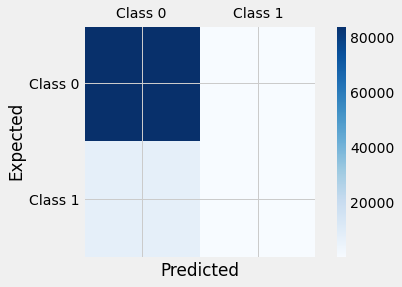

AUC   :  0.7074039567846563


In [47]:
acc_21, f1_21, recall_21, auc_21, best_params_21 , fn_21, fp_21 = modelCV(rfc,X_train, y_train,X_test,y_test,rfc_parameters)

#### I.3 - Decision Tree Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'criterion': 'gini', 'max_depth': 3}
DecisionTreeClassifier()
Accuracy score :  0.9194289678496326
F1_Score score :  0.0
Recall score   :  0.0
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.00      0.00      0.00      7433

    accuracy                           0.92     92254
   macro avg       0.46      0.50      0.48     92254
weighted avg       0.85      0.92      0.88     92254

confusion matrix report :
 [[84821     0]
 [ 7433     0]]
  tn: 84821 fp: 0 , fn: 7433 , tp: 0: 


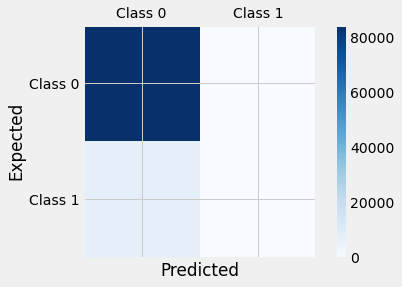

AUC   :  0.6837574188746761


In [48]:
acc_31, f1_31, recall_31, auc_31, best_params_31 , fn_31, fp_31 = modelCV(dtc,X_train, y_train,X_test,y_test,dtc_parameters)

#### I.4 - XGBoost Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'max_depth': 5, 'min_child_weight': 3}
XGBClassifier()
Accuracy score :  0.9195915624254775
F1_Score score :  0.0270199370409234
Recall score   :  0.013857123637831294
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.54      0.01      0.03      7433

    accuracy                           0.92     92254
   macro avg       0.73      0.51      0.49     92254
weighted avg       0.89      0.92      0.88     92254

confusion matrix report :
 [[84733    88]
 [ 7330   103]]
  tn: 84733 fp: 88 , fn: 7330 , tp: 103: 


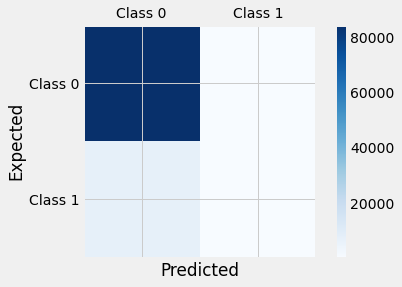

AUC   :  0.7555548167116731


In [87]:
acc_41, f1_41, recall_41, auc_41, best_params_41 , fn_41, fp_41 = modelCV(xgb,X_train, y_train,X_test,y_test,xgb_parameters)

#### I.5 - Light GBM classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'boosting_type': 'gbdt', 'max_depth': 5, 'n_estimators': 100}
LGBMClassifier()
Accuracy score :  0.9196891191709845
F1_Score score :  0.026540533438444355
Recall score   :  0.013588053275931657
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.57      0.01      0.03      7433

    accuracy                           0.92     92254
   macro avg       0.74      0.51      0.49     92254
weighted avg       0.89      0.92      0.88     92254

confusion matrix report :
 [[84744    77]
 [ 7332   101]]
  tn: 84744 fp: 77 , fn: 7332 , tp: 101: 


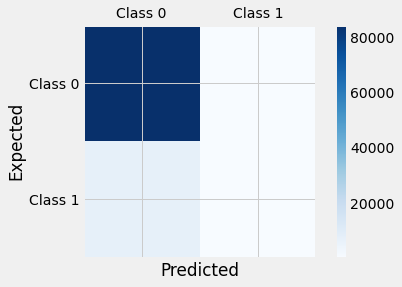

AUC   :  0.7552345150940151


In [50]:
acc_51, f1_51, recall_51, auc_51, best_params_51 , fn_51, fp_51 = modelCV(lgbm,X_train, y_train,X_test,y_test,lgbm_parameters)
## Apprenants faibles

### II- Métrique métier personnalisée

Considérons les notations suivantes: Faux négatif (FN): mauvais client (classe 1) prédit comme bon client (classe 0). Faux positif: bon client (classe 0) prédit comme mauvais client (classe 1). Vrai négatif (TN): un bon client et finalement le vrai positif (TP): le client qui ne va pas rembourser son crédit. Nous détaillons ci-après les types de coûts à évaluer selon ces critères:

* TP = pas de pertes et pas de gain.  
* TN = gain des intérets.  
* FP = perte des intérêts non acquis.  
* FN = perte des intérêts et perte de crédits. 
 
Il est plus coûteux pour la banque de donner de l'argent à un mauvais client (FN) que de ne pas donner d'argent à un bon client (FP). Cela doit être pris en compte lors de la sélection d'une mesure de performance. L'idée est d'attribuer une pénalité différente à chaque erreur de classification pour la classe positive. Plus précisément, un coût de dix est appliqué à un faux négatif (marquant un mauvais client comme bon) et un coût de un est attribué à un faux positif (marquant un bon client comme mauvais).

Pour optimiser l'évaluation des différents modèles, nous faisons le choix d'utiliser une nouvelle métrique personnalisée `  min {metric_metier} = max { -( FP + 10 * FN ) }`  qui vise à minimiser les pertes. Diminuer FN implique augmenter le Recall ` recall = (TP/(TP + FN))`. Nous en déduisons au préalable que la précision ` precision = (TP/(TP + FP))`  peut diminuer dans le processus pour augmenter le rappel, mais il est normal de prédire certains faux positifs supplémentaires. L'accuracy représente le taux de bonne prédiction sur l'échantillon.
Nous comparerons donc nos différents tests avec le score obtenu afin d'obtenir des modèles plus satisfaisants.

In [51]:
# y_test = y_true  ;  y_pred = predictions

def my_custom_metrique_provisoire (y_test, predictions):    
    tn, fp, fn, tp = confusion_matrix(y_test, predictions, labels=[0,1]).ravel()  
    # métrique métier qui sert à minimiser les pertes (fp +10 * fn) en accentuant les pertes issues de fn
    metric_metier = -fp - 10 * fn

    return metric_metier
# ---> sur le modele valeur predict de l'algo et la valeur réelle.

In [52]:
# utilisation du nouveau scorer qui diminue les pertes d'intérêt et de crédit
my_scorer = make_scorer(my_custom_metrique_provisoire, greater_is_better=True)

In [53]:
#Model function utilisant la métrique métier
def modelCVmetrique(algorithm, X_train, y_train, X_test, y_test, parameters):
    # Créer un classifieur clf avec recherche d'hyperparamètre par validation croisée
    clf = model_selection.GridSearchCV(
    algorithm, # un classifieur
    parameters,     # hyperparamètres à tester
    cv=5,           # nombre de folds de validation croisée   
    scoring=my_scorer,  # nouveau scorer personnalisé
    )
    
    
    # Calculer la valeur sur la base de test
    
    # Train on the training data
    # Optimiser ce classifieur sur le jeu d'entraînement
    clf.fit(X_train, y_train)
    
    # Afficher le(s) hyperparamètre(s) optimaux
    print("Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:")
    print(clf.best_params_)

    predictions = clf.predict(X_test) # ceci fonctionne bien pour tout sauf AUC
    # Pour AUC il faut rajouter predict_proba.
    print (algorithm)
    
    acc = accuracy_score(y_test, predictions)
    f1 = f1_score(y_test, predictions)
    recall = recall_score(y_test, predictions)
    
    print ("Accuracy score : ", acc)
    print ("F1_Score score : ", f1)
    print ("Recall score   : ", recall)
    # Customized Scorer
    metric_metier = my_custom_metrique_provisoire (y_test, predictions)
    print ("Customized scorer : ", metric_metier)
    
    
    
    #  (3) ------> A remplacer par la matrice de confusion sur la base de test.    
    print ("classification report :\n",classification_report(y_test, predictions))
    print ("confusion matrix report :\n",confusion_matrix(y_test, predictions))
    tn, fp, fn, tp = confusion_matrix(y_test, predictions, labels=[0,1]).ravel()

    print ("  tn: {0} fp: {1} , fn: {2} , tp: {3}: ".format(tn, fp, fn, tp) )
    # metrics.confusion_matrix(y_true, y_pred)
    conf_mat = confusion_matrix(y_true=y_test, y_pred=predictions)
    labels = ['Class 0', 'Class 1']
    fig = plt.figure()
    ax = fig.add_subplot(111)
    cax = ax.matshow(conf_mat, cmap=plt.cm.Blues)
    fig.colorbar(cax)
    ax.set_xticklabels([''] + labels)
    ax.set_yticklabels([''] + labels)
    plt.xlabel('Predicted')
    plt.ylabel('Expected')
    plt.show()
 
    # predict the probabilities of not paying a loan
    prediction_probabilities = clf.predict_proba(X_test)[:, 1]
    auc = roc_auc_score(y_test , prediction_probabilities)
    print ("AUC   : ", auc)
    return (acc, f1, recall, auc, clf.best_params_ , metric_metier, fn, fp)


#### II.1 - Logistic Regression

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'C': 1}
LogisticRegression()
Accuracy score :  0.9193314111041255
F1_Score score :  0.02668061731624379
Recall score   :  0.013722588456881474
Customized scorer :  -73421
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.48      0.01      0.03      7433

    accuracy                           0.92     92254
   macro avg       0.70      0.51      0.49     92254
weighted avg       0.88      0.92      0.88     92254

confusion matrix report :
 [[84710   111]
 [ 7331   102]]
  tn: 84710 fp: 111 , fn: 7331 , tp: 102: 


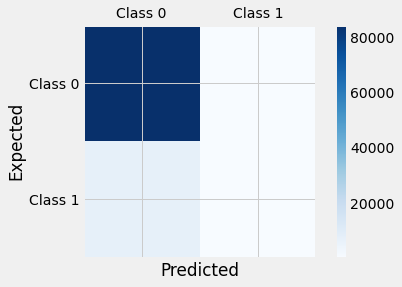

AUC   :  0.7471908605825232


In [54]:
acc_12, f1_12, recall_12, auc_12, best_params_12 , metric_metier_12, fn_12, fp_12 = modelCVmetrique(logit,X_train, y_train,X_test,y_test,logit_parameters)

In [55]:
print("acc_12 :{0}, f1_12: {1}, recall_12: {2}, auc_12: {3}, best_params_12: {4} , metric_metier_12: {5}, fn_12: {6}, fp_12: {7}".format(acc_12, f1_12, recall_12, auc_12, best_params_12 , metric_metier_12, fn_12, fp_12))

acc_12 :0.9193314111041255, f1_12: 0.02668061731624379, recall_12: 0.013722588456881474, auc_12: 0.7471908605825232, best_params_12: {'C': 1} , metric_metier_12: -73421, fn_12: 7331, fp_12: 111


#### II.2 - Random Forest Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'criterion': 'gini', 'max_depth': 20, 'n_estimators': 10}
RandomForestClassifier()
Accuracy score :  0.9191362976131117
F1_Score score :  0.00797872340425532
Recall score   :  0.004036055428494552
Customized scorer :  -74087
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.34      0.00      0.01      7433

    accuracy                           0.92     92254
   macro avg       0.63      0.50      0.48     92254
weighted avg       0.87      0.92      0.88     92254

confusion matrix report :
 [[84764    57]
 [ 7403    30]]
  tn: 84764 fp: 57 , fn: 7403 , tp: 30: 


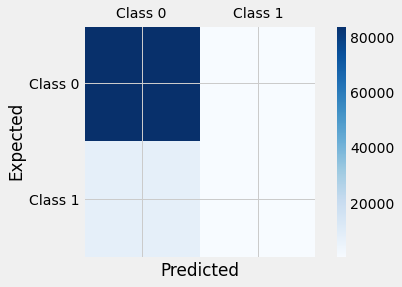

AUC   :  0.6816249051648787


In [56]:
acc_22, f1_22, recall_22, auc_22, best_params_22 , metric_metier_22, fn_22, fp_22 = modelCVmetrique(rfc,X_train, y_train,X_test,y_test,rfc_parameters)


#### II.3 - Decision Tree Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'criterion': 'gini', 'max_depth': 14}
DecisionTreeClassifier()
Accuracy score :  0.9089795564419971
F1_Score score :  0.08817461179281137
Recall score   :  0.05462128346562626
Customized scorer :  -71640
classification report :
               precision    recall  f1-score   support

           0       0.92      0.98      0.95     84821
           1       0.23      0.05      0.09      7433

    accuracy                           0.91     92254
   macro avg       0.58      0.52      0.52     92254
weighted avg       0.87      0.91      0.88     92254

confusion matrix report :
 [[83451  1370]
 [ 7027   406]]
  tn: 83451 fp: 1370 , fn: 7027 , tp: 406: 


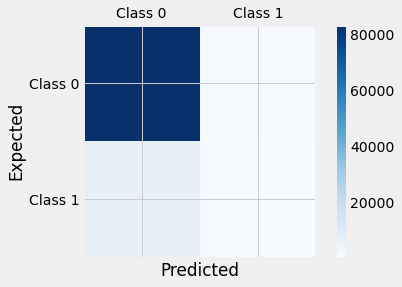

AUC   :  0.67134527756383


In [57]:
#modelCVmetrique(dtc,X_train, y_train,X_test,y_test,parameters)
acc_32, f1_32, recall_32, auc_32, best_params_32 , metric_metier_32, fn_32, fp_32 = modelCVmetrique(dtc,X_train, y_train,X_test,y_test,dtc_parameters)



#### II.3 - XG Boost Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'max_depth': 5, 'min_child_weight': 3}
XGBClassifier()
Accuracy score :  0.9195915624254775
F1_Score score :  0.0270199370409234
Recall score   :  0.013857123637831294
Customized scorer :  -73388
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.54      0.01      0.03      7433

    accuracy                           0.92     92254
   macro avg       0.73      0.51      0.49     92254
weighted avg       0.89      0.92      0.88     92254

confusion matrix report :
 [[84733    88]
 [ 7330   103]]
  tn: 84733 fp: 88 , fn: 7330 , tp: 103: 


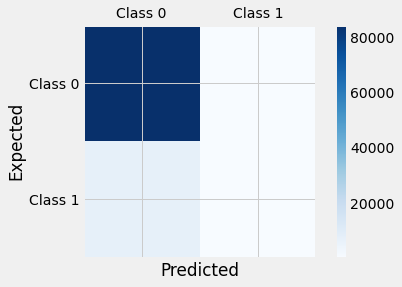

AUC   :  0.7555548167116731


In [88]:
#modelCV(xgb,X_train, y_train,X_test,y_test,parameters)
acc_42, f1_42, recall_42, auc_42, best_params_42 , metric_metier_42, fn_42, fp_42 = modelCVmetrique(xgb,X_train, y_train,X_test,y_test,xgb_parameters)

#### II.4 - LightGmb Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'boosting_type': 'gbdt', 'max_depth': 5, 'n_estimators': 100}
LGBMClassifier()
Accuracy score :  0.9196891191709845
F1_Score score :  0.026540533438444355
Recall score   :  0.013588053275931657
Customized scorer :  -73397
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.57      0.01      0.03      7433

    accuracy                           0.92     92254
   macro avg       0.74      0.51      0.49     92254
weighted avg       0.89      0.92      0.88     92254

confusion matrix report :
 [[84744    77]
 [ 7332   101]]
  tn: 84744 fp: 77 , fn: 7332 , tp: 101: 


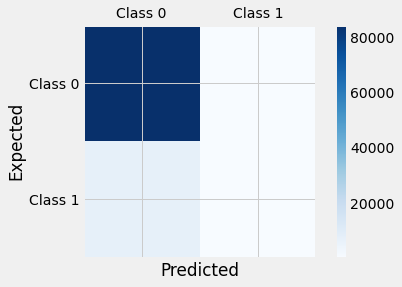

AUC   :  0.7552345150940151


In [59]:
#modelCV(lgbm,X_train, y_train,X_test,y_test,parameters)
acc_52, f1_52, recall_52, auc_52, best_params_52 , metric_metier_52, fn_52, fp_52 = modelCVmetrique(lgbm,X_train, y_train,X_test,y_test,lgbm_parameters)

### III- Gestion du déséquilibre des classes avec la pondération (classweight)  


Etant donné que les classes ne sont pas équilibrées, l'application de la pondération présente une piste d'améliorations possible. Il est à noter que le scoring de cette partie est fait à la base de la métrique personnalisée.

#### III.1 - LogisticRegression

In [60]:
logit_cw = LogisticRegression(solver="liblinear", class_weight="balanced")

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'C': 0.1}
LogisticRegression(class_weight='balanced', solver='liblinear')
Accuracy score :  0.6892275673683526
F1_Score score :  0.26024357518835795
Recall score   :  0.6784609175299341
Customized scorer :  -50180
classification report :
               precision    recall  f1-score   support

           0       0.96      0.69      0.80     84821
           1       0.16      0.68      0.26      7433

    accuracy                           0.69     92254
   macro avg       0.56      0.68      0.53     92254
weighted avg       0.90      0.69      0.76     92254

confusion matrix report :
 [[58541 26280]
 [ 2390  5043]]
  tn: 58541 fp: 26280 , fn: 2390 , tp: 5043: 


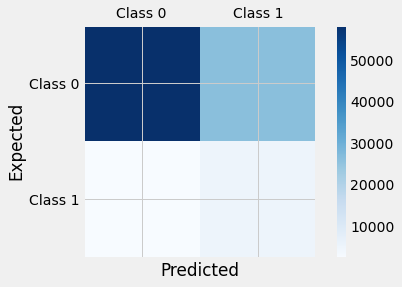

AUC   :  0.74759052147729


In [61]:
acc_13, f1_13, recall_13, auc_13, best_params_13 , metric_metier_13, fn_13, fp_13 = modelCVmetrique(logit_cw,X_train, y_train,X_test,y_test,logit_parameters)

#### III.2 - Random Forest Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'criterion': 'entropy', 'max_depth': 10, 'n_estimators': 100}
RandomForestClassifier(class_weight='balanced')
Accuracy score :  0.7126086673748564
F1_Score score :  0.25627647339336307
Recall score   :  0.6145567065787704
Customized scorer :  -52298
classification report :
               precision    recall  f1-score   support

           0       0.96      0.72      0.82     84821
           1       0.16      0.61      0.26      7433

    accuracy                           0.71     92254
   macro avg       0.56      0.67      0.54     92254
weighted avg       0.89      0.71      0.78     92254

confusion matrix report :
 [[61173 23648]
 [ 2865  4568]]
  tn: 61173 fp: 23648 , fn: 2865 , tp: 4568: 


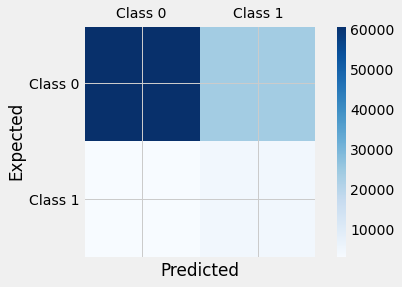

AUC   :  0.7263855573614777


In [62]:
rfc_cw = RandomForestClassifier(class_weight="balanced")
acc_23, f1_23, recall_23, auc_23, best_params_23 , metric_metier_23, fn_23, fp_23 = modelCVmetrique(rfc_cw,X_train, y_train,X_test,y_test,rfc_parameters)

#### III.3 - Decision Tree Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'criterion': 'entropy', 'max_depth': 8}
DecisionTreeClassifier(class_weight='balanced')
Accuracy score :  0.6672989789060637
F1_Score score :  0.24115509184859205
Recall score   :  0.6561280774922642
Customized scorer :  -53697
classification report :
               precision    recall  f1-score   support

           0       0.96      0.67      0.79     84821
           1       0.15      0.66      0.24      7433

    accuracy                           0.67     92254
   macro avg       0.55      0.66      0.51     92254
weighted avg       0.89      0.67      0.74     92254

confusion matrix report :
 [[56684 28137]
 [ 2556  4877]]
  tn: 56684 fp: 28137 , fn: 2556 , tp: 4877: 


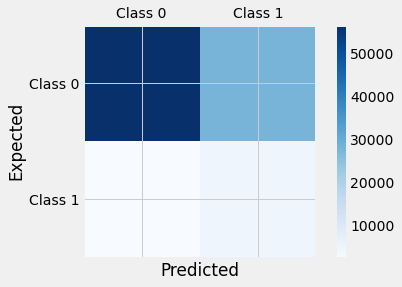

AUC   :  0.7116445454677579


In [63]:
dtc_cw = DecisionTreeClassifier(class_weight="balanced")
acc_33, f1_33, recall_33, auc_33, best_params_33 , metric_metier_33, fn_33, fp_33 = modelCVmetrique(dtc_cw,X_train, y_train,X_test,y_test,dtc_parameters)

#### III.3 - XG Boost Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'max_depth': 5, 'min_child_weight': 3}
XGBClassifier(class_weight='balanced')
Accuracy score :  0.9195915624254775
F1_Score score :  0.0270199370409234
Recall score   :  0.013857123637831294
Customized scorer :  -73388
classification report :
               precision    recall  f1-score   support

           0       0.92      1.00      0.96     84821
           1       0.54      0.01      0.03      7433

    accuracy                           0.92     92254
   macro avg       0.73      0.51      0.49     92254
weighted avg       0.89      0.92      0.88     92254

confusion matrix report :
 [[84733    88]
 [ 7330   103]]
  tn: 84733 fp: 88 , fn: 7330 , tp: 103: 


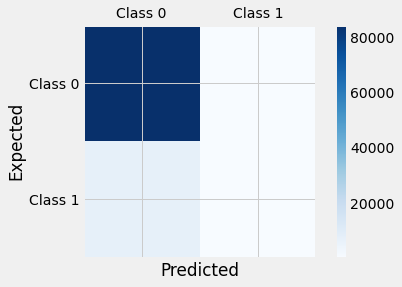

AUC   :  0.7555548167116731


In [74]:
xgb_cw = XGBClassifier(class_weight="balanced")
acc_43, f1_43, recall_43, auc_43, best_params_43 , metric_metier_43, fn_43, fp_43 = modelCVmetrique(xgb_cw,X_train, y_train,X_test,y_test,xgb_parameters)

#### III.4 - LightGmb Classifier

Meilleur(s) hyperparamètre(s) sur le jeu d'entraînement:
{'boosting_type': 'goss', 'max_depth': 5, 'n_estimators': 100}
LGBMClassifier(class_weight='balanced')
Accuracy score :  0.706115723979448
F1_Score score :  0.2676391139924365
Recall score   :  0.6664872864254002
Customized scorer :  -49423
classification report :
               precision    recall  f1-score   support

           0       0.96      0.71      0.82     84821
           1       0.17      0.67      0.27      7433

    accuracy                           0.71     92254
   macro avg       0.56      0.69      0.54     92254
weighted avg       0.90      0.71      0.77     92254

confusion matrix report :
 [[60188 24633]
 [ 2479  4954]]
  tn: 60188 fp: 24633 , fn: 2479 , tp: 4954: 


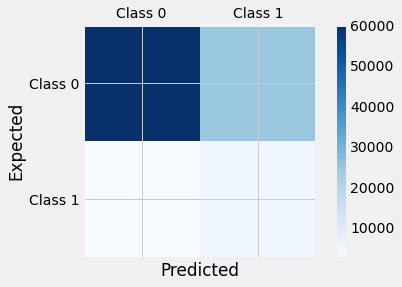

AUC   :  0.755197343090611


In [65]:
lgbm_cw = LGBMClassifier(class_weight="balanced") 
#modelCV(lgbm,X_train, y_train,X_test,y_test,parameters)
acc_53, f1_53, recall_53, auc_53, best_params_53 , metric_metier_53, fn_53, fp_53 = modelCVmetrique(lgbm_cw,X_train, y_train,X_test,y_test,lgbm_parameters)

## C- Interprétation des résultats

Ci-après un tableau récapituatif des performances avec toutes les améliorations. 

### - Tableau 1: Tableau récapitulatif des performances

In [225]:
metric_metier_11=metric_metier_21=metric_metier_31=metric_metier_41=metric_metier_51=0
models = pd.DataFrame({
    'Model': ['Logistic Regression','Logistic Regression','Logistic Regression', 'Random Forest', 'Random Forest', 'Random Forest', 'Decision Tree', 'Decision Tree','Decision Tree','XG Boost','XG Boost','XG Boost', 'Light GMB', 'Light GMB', 'Light GMB'],
    'Optimisation' : ['Aucune','Metrique métier','Pondération','Aucune','Metrique métier','Pondération','Aucune','Metrique métier','Pondération','Aucune','Metrique métier','Pondération','Aucune','Metrique métier','Pondération'],
    'Accuracy Score': [acc_11,acc_12,acc_13,acc_21,acc_22,acc_23,acc_31,acc_32,acc_33  ,acc_41,acc_42,acc_43  ,acc_51,acc_52,acc_53],
    'F1 Score' : [f1_11,f1_12,f1_13,f1_21,f1_22,f1_23,f1_31,f1_32,f1_33 ,f1_41,f1_42,f1_43  ,f1_51,f1_52,f1_53],
    'Recall Score' : [recall_11,recall_12,recall_13,recall_21,recall_22,recall_23,recall_31,recall_32,recall_33, recall_41,recall_42,recall_43 ,recall_51,recall_52,recall_53],
    'AUC Score' : [auc_11,auc_12,auc_13,auc_21,auc_22,auc_23,auc_31,auc_32,auc_33  ,auc_41,auc_42,auc_43 ,auc_51,auc_52,auc_53],
    'Paramètres' : [best_params_11,best_params_12, best_params_13,best_params_21,best_params_22,best_params_23,best_params_31,best_params_32,best_params_33 ,best_params_41,best_params_42,best_params_43  ,best_params_51,best_params_52,best_params_53],
    'Metrique métier' : [metric_metier_11,metric_metier_12,metric_metier_13,metric_metier_21,metric_metier_22,metric_metier_23,metric_metier_31,metric_metier_32,metric_metier_33  ,metric_metier_41,metric_metier_42,metric_metier_43   ,metric_metier_51,metric_metier_52,metric_metier_53],
    'fn' : [fn_11,fn_12,fn_13,fn_21,fn_22,fn_23,fn_31,fn_32,fn_33 ,fn_41,fn_42,fn_43  ,fn_51,fn_52,fn_53],
    'fp' : [fp_11,fp_12,fp_13,fp_21,fp_22,fp_23,fp_31,fp_32,fp_33 ,fp_41,fp_42,fp_43  ,fp_51,fp_52,fp_53]
})
models.to_csv("models_pertes.csv",sep="\t", index=False)
#pd.pivot_table(models,index = ["Model","Optimisation"])

In [226]:
models

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
0,Logistic Regression,Aucune,0.919299,0.022838,0.011705,0.746966,{'C': 0.01},0,7346,99
1,Logistic Regression,Metrique métier,0.919331,0.026681,0.013723,0.747191,{'C': 1},-73421,7331,111
2,Logistic Regression,Pondération,0.689228,0.260244,0.678461,0.747591,{'C': 0.1},-50180,2390,26280
3,Random Forest,Aucune,0.919407,0.000269,0.000135,0.707404,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",0,7432,3
4,Random Forest,Metrique métier,0.919136,0.007979,0.004036,0.681625,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",-74087,7403,57
5,Random Forest,Pondération,0.712609,0.256276,0.614557,0.726386,"{'criterion': 'entropy', 'max_depth': 10, 'n_e...",-52298,2865,23648
6,Decision Tree,Aucune,0.919429,0.000000,0.000000,0.683757,"{'criterion': 'gini', 'max_depth': 3}",0,7433,0
7,Decision Tree,Metrique métier,0.908980,0.088175,0.054621,0.671345,"{'criterion': 'gini', 'max_depth': 14}",-71640,7027,1370
8,Decision Tree,Pondération,0.667299,0.241155,0.656128,0.711645,"{'criterion': 'entropy', 'max_depth': 8}",-53697,2556,28137
9,XG Boost,Aucune,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",0,7330,88


### 1) Interprétation des résultats sans l'ajout des améliorations: 

Tout d'abord, on commence par évaluer la performance des modèles sans l'ajout d'améliorations. Les algorithmes du tableau suivant sont classifiés selon le rappel (recall). D'après le tableau récapitulatif, les modèles XG Boost et Light GMB ainsi que la régression logistique sont les plus performants puisqu'ils présentent les meilleurs scores (Recall Score et F1 Score) et ils minimisent l'erreur relative à FN.

In [227]:
models_base=models[models['Optimisation']=='Aucune'] .sort_values(['Recall Score'], ascending=False)

In [228]:
models_base

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
9,XG Boost,Aucune,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",0,7330,88
12,Light GMB,Aucune,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",0,7332,77
0,Logistic Regression,Aucune,0.919299,0.022838,0.011705,0.746966,{'C': 0.01},0,7346,99
3,Random Forest,Aucune,0.919407,0.000269,0.000135,0.707404,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",0,7432,3
6,Decision Tree,Aucune,0.919429,0.000000,0.000000,0.683757,"{'criterion': 'gini', 'max_depth': 3}",0,7433,0


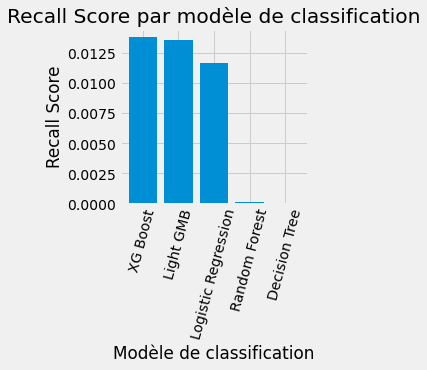

In [229]:
plt.figure(figsize = (3, 3))

# Graph the Model bins and the REcall Score  as a bar plot
plt.bar(models_base.Model, models_base['Recall Score'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Modèle de classification'); plt.ylabel('Recall Score')
plt.title('Recall Score par modèle de classification');




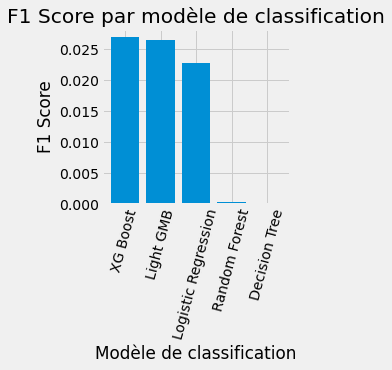

In [182]:
plt.figure(figsize = (3, 3))

# Graph the Model bins and the F1 Score  as a bar plot
plt.bar(models_base.Model, models_base['F1 Score'])

# Plot labeling
plt.xticks(rotation = 75); plt.xlabel('Modèle de classification'); plt.ylabel('F1 Score')
plt.title('F1 Score par modèle de classification');



### 2) Création d'une métrique en lien avec le besoin métier :
L'ajout de la métrique métier a amélioré les résultats des moins bons algorithmes Decision Tree, Logistic Regression, Random Forest mais pas les résultats des deux meilleurs classificateurs à savoir  XG Boost et Light GMB. En fait, la performance est restée la même avec ou sans l'ajout de la métrique (en comparant f1_score et le recall).

In [246]:
def compareResult(param):
    labels= ['Logistic Regression', 'Random Forest', 'Decision Tree',  'XG Boost', 'Light GMB']
    aucune_metrique =  models[models['Optimisation']=='Aucune'][param].values# => avant métrique
    avec_metrique = models[models['Optimisation']=='Metrique métier'][param].values # => après metrique

    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, aucune_metrique, width, label='Sans métrique')
    rects2 = ax.bar(x + width/2, avec_metrique, width, label='Avec métrique')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel(param)
    param= param +' par modèle et optimisation'
    ax.set_title(param)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.xticks(rotation = 75);
    #fig.tight_layout()

    plt.show()



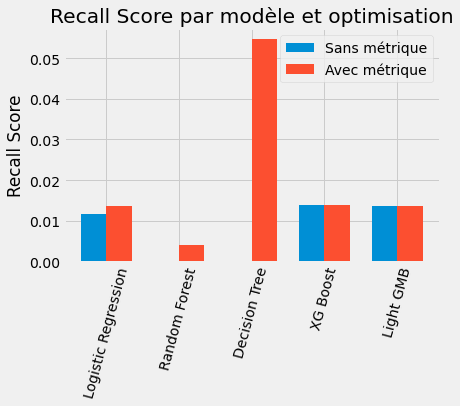

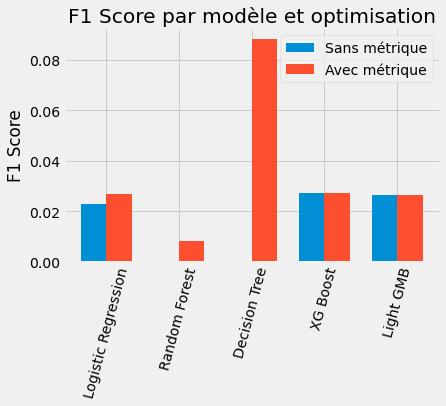

In [293]:
compareResult('Recall Score')
compareResult('F1 Score')
#compareResult('fn')

In [223]:
models[models['Optimisation']!='Pondération'].sort_values(['Recall Score'], ascending=False)

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
7,Decision Tree,Metrique métier,0.908980,0.088175,0.054621,0.671345,"{'criterion': 'gini', 'max_depth': 14}",-71640,7027,1370
9,XG Boost,Aucune,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",0,7330,88
10,XG Boost,Metrique métier,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",-73388,7330,88
1,Logistic Regression,Metrique métier,0.919331,0.026681,0.013723,0.747191,{'C': 1},-73421,7331,111
12,Light GMB,Aucune,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",0,7332,77
13,Light GMB,Metrique métier,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-73397,7332,77
0,Logistic Regression,Aucune,0.919299,0.022838,0.011705,0.746966,{'C': 0.01},0,7346,99
4,Random Forest,Metrique métier,0.919136,0.007979,0.004036,0.681625,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",-74087,7403,57
3,Random Forest,Aucune,0.919407,0.000269,0.000135,0.707404,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",0,7432,3
6,Decision Tree,Aucune,0.919429,0.000000,0.000000,0.683757,"{'criterion': 'gini', 'max_depth': 3}",0,7433,0


In [224]:
models[models['Optimisation']!='Pondération'].sort_values(['F1 Score'], ascending=False)

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
7,Decision Tree,Metrique métier,0.908980,0.088175,0.054621,0.671345,"{'criterion': 'gini', 'max_depth': 14}",-71640,7027,1370
9,XG Boost,Aucune,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",0,7330,88
10,XG Boost,Metrique métier,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",-73388,7330,88
1,Logistic Regression,Metrique métier,0.919331,0.026681,0.013723,0.747191,{'C': 1},-73421,7331,111
12,Light GMB,Aucune,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",0,7332,77
13,Light GMB,Metrique métier,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-73397,7332,77
0,Logistic Regression,Aucune,0.919299,0.022838,0.011705,0.746966,{'C': 0.01},0,7346,99
4,Random Forest,Metrique métier,0.919136,0.007979,0.004036,0.681625,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",-74087,7403,57
3,Random Forest,Aucune,0.919407,0.000269,0.000135,0.707404,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",0,7432,3
6,Decision Tree,Aucune,0.919429,0.000000,0.000000,0.683757,"{'criterion': 'gini', 'max_depth': 3}",0,7433,0


In [232]:
models[models['Optimisation']!='Pondération'].sort_values(['Accuracy Score'], ascending=False)

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
12,Light GMB,Aucune,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",0,7332,77
13,Light GMB,Metrique métier,0.919689,0.026541,0.013588,0.755235,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-73397,7332,77
9,XG Boost,Aucune,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",0,7330,88
10,XG Boost,Metrique métier,0.919592,0.027020,0.013857,0.755555,"{'max_depth': 5, 'min_child_weight': 3}",-73388,7330,88
6,Decision Tree,Aucune,0.919429,0.000000,0.000000,0.683757,"{'criterion': 'gini', 'max_depth': 3}",0,7433,0
3,Random Forest,Aucune,0.919407,0.000269,0.000135,0.707404,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",0,7432,3
1,Logistic Regression,Metrique métier,0.919331,0.026681,0.013723,0.747191,{'C': 1},-73421,7331,111
0,Logistic Regression,Aucune,0.919299,0.022838,0.011705,0.746966,{'C': 0.01},0,7346,99
4,Random Forest,Metrique métier,0.919136,0.007979,0.004036,0.681625,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",-74087,7403,57
7,Decision Tree,Metrique métier,0.908980,0.088175,0.054621,0.671345,"{'criterion': 'gini', 'max_depth': 14}",-71640,7027,1370


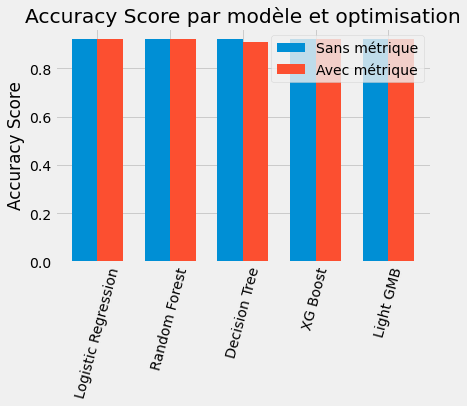

In [294]:
compareResult('Accuracy Score')

Pour les mêmes modèles qui ont présenté des améliorations pour le F1 score et le rappel, on observe une baisse en Accuracy score. Nous devons faire un compromis entre la performance globale du sytsème et l'accuracy.

### 3) Gestion du problème du déséquilibre des classes : Pondération des classes avec class_weights  
* En général, la pondération fait que les modèles sont globalement moins performants sur certains critères (La métrique qu'on cherche à minimiser augmente, l'accuracy diminue) mais les amène à mieux fonctionner sur d'autres segments (recall, f1_score, fn) ce qui correspond à la stratégie adoptée pour améliorer les performances des modèles.

In [253]:
def compareResult2(param):
    labels= ['Logistic Regression', 'Random Forest', 'Decision Tree', 'XG Boost', 'Light GMB']
    avec_metrique = models[models['Optimisation']=='Metrique métier'][param].values # => après metrique
    avec_pondération = models[models['Optimisation']=='Pondération'][param].values # => après pondération


    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, avec_metrique, width, label='Avec métrique', color='r')
    rects2 = ax.bar(x + width/2, avec_pondération, width, label='Pondération', color='g')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel(param)
    param= 'Evolution du '+param +' par modèle et optimisation'
    ax.set_title(param)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.xticks(rotation = 75);
    #fig.tight_layout()

    plt.show()

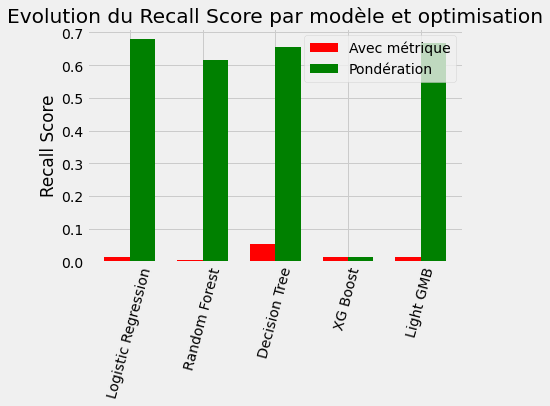

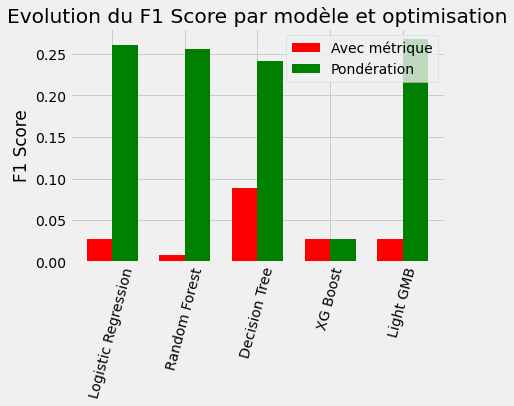

In [254]:
compareResult2('Recall Score')
compareResult2('F1 Score')

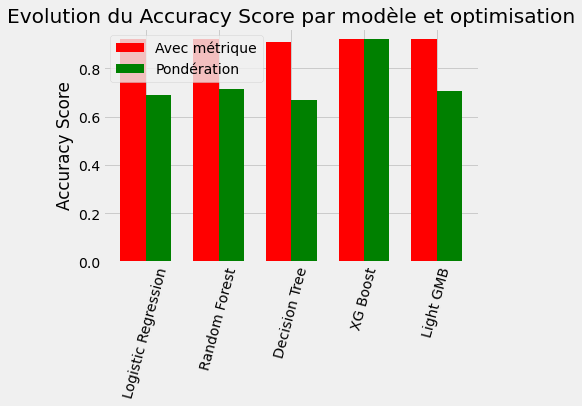

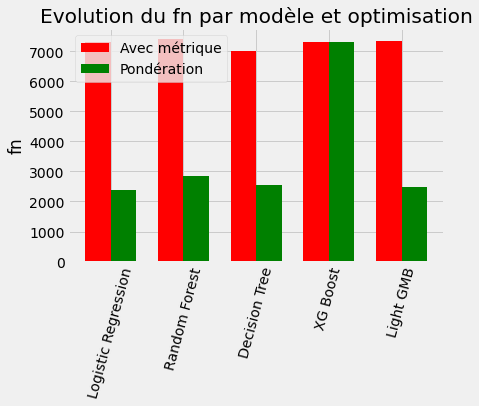

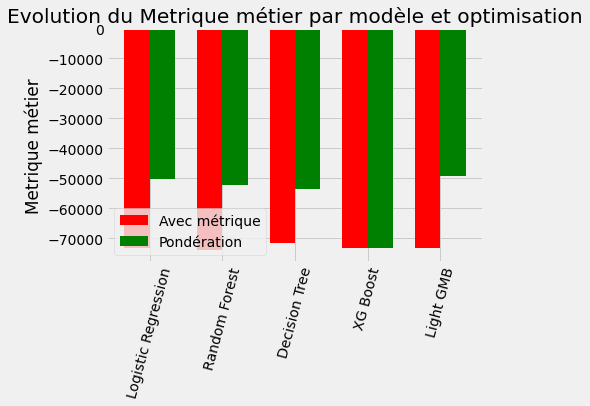

In [257]:
compareResult2('Accuracy Score')
compareResult2('fn')
compareResult2('Metrique métier')

### 4) Création de nouvelles variables :   
En guise d'amélioration des performances, il y a création de nouvelles variables. Ces variables sont les suivantes: 

* `CREDIT_ANNUITY_RATIO`: le pourcentage du montant du crédit par rapport à la rente de prêt d'un client ( the percentage of the credit amount relative to a client's loan annuity).
* `CREDIT_GOODS_PRICE_RATIO`:  le pourcentage du montant du crédit par rapport au revenu d'un client (the percentage of the credit amount relative to a client's income).
* `CREDIT_DOWNPAYMENT`:  la durée du paiement en mois puisque la rente est le montant mensuel dû (the length of the payment in months since the annuity is the monthly amount due).
* `AGE_INT`: le rapport entre l'âge du client et le nombre de jours par an (the ratio of the client's age relative to the number of days by a year).

Pour ce faire, il y a eu :   
- Reprise de toutes les étapes précédentes en rajoutant dès le départ les nouvelles variables dans un notebook séparé "models_vars_pertes.csv".  
- Chargement des résultats du deuxième notebook puis comparaison avec les résultats de ce notebook.

In [258]:
# Téléchargement des données recensées lors de l'ajout des trois nouvelles variables
models_vars=pd.read_csv('models_vars_pertes.csv', sep='\t')

In [270]:
def compareResult3(param , cas):
    """ 
        param : La variable soit le rappel ou le f1 score
        cas : soit cas avec ajout de la métrique métier ou le cas après l'amélioration avec la pondération
    """
    
    labels= ['Logistic Regression', 'Random Forest', 'Decision Tree', 'XG Boost', 'Light GMB']
    initial = models[models['Optimisation']==cas][param].values # => après metrique
    ajout_variables = models_vars[models_vars['Optimisation']==cas][param].values # => après pondération


    x = np.arange(len(labels))  # the label locations
    width = 0.35  # the width of the bars

    fig, ax = plt.subplots()
    rects1 = ax.bar(x - width/2, initial, width, label='Initial', color='purple')
    rects2 = ax.bar(x + width/2, ajout_variables, width, label='Ajout variables', color='y')

    # Add some text for labels, title and custom x-axis tick labels, etc.
    ax.set_ylabel(param)
    param= 'Evolution du '+param +' par modèle et par ajout de variables \n - cas: ' + cas
    ax.set_title(param)
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    plt.xticks(rotation = 75);
    #fig.tight_layout()

    plt.show()

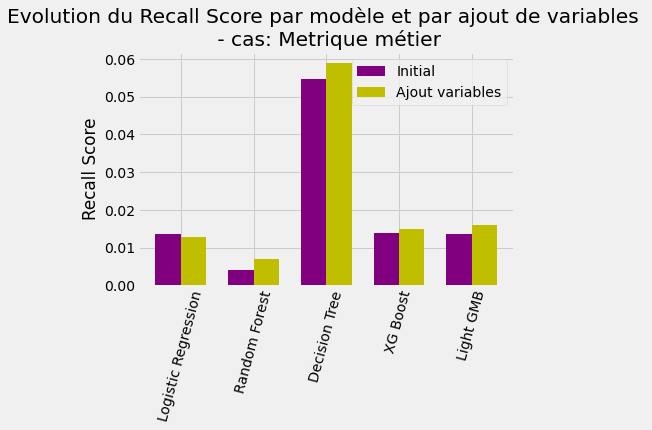

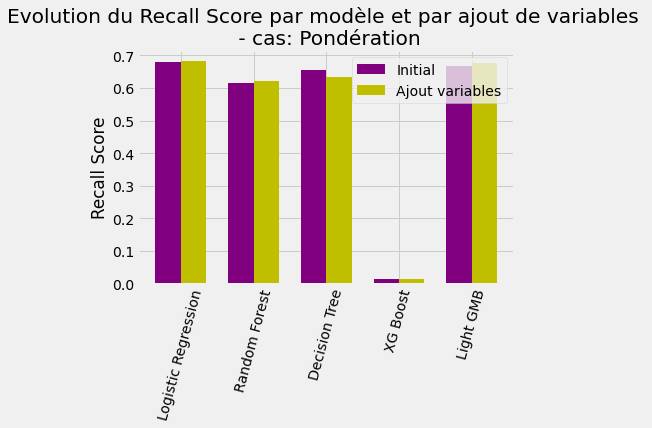

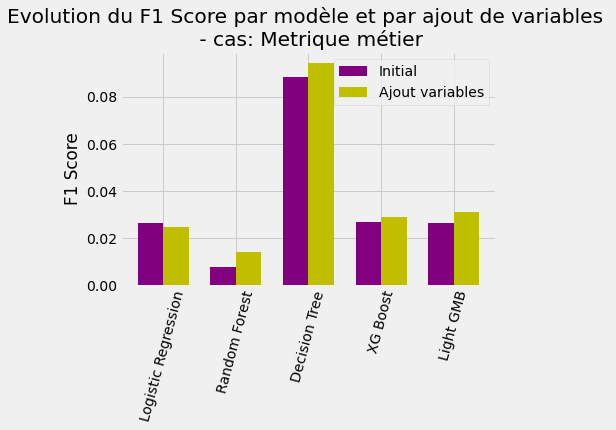

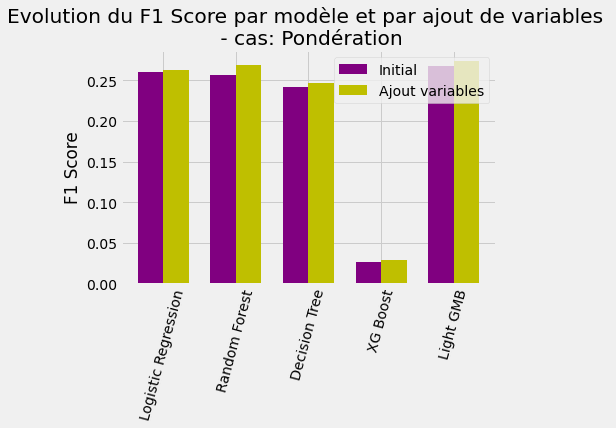

In [271]:
compareResult3('Recall Score' ,'Metrique métier')
compareResult3('Recall Score' ,'Pondération')
compareResult3('F1 Score' ,'Metrique métier')
compareResult3('F1 Score' ,'Pondération')

Ces résultats viennent confirmer que l'ajout de ces nouvelles variables a effectivement contribué à l'amélioration des performances des modèles.

In [259]:
#Vérification des performances en fonction de 'Recall Score'
models_vars[models['Recall Score'] < models_vars['Recall Score']].sort_values(['Recall Score'], ascending=False)

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
2,Logistic Regression,Pondération,0.690702,0.262382,0.681574,0.751374,{'C': 0.1},-49873,2371,26163
14,Light GMB,Pondération,0.709758,0.273142,0.675665,0.763785,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-48511,2415,24361
5,Random Forest,Pondération,0.727210,0.268770,0.621139,0.740916,"{'criterion': 'entropy', 'max_depth': 10, 'n_e...",-50555,2821,22345
7,Decision Tree,Metrique métier,0.908611,0.094123,0.058824,0.675227,"{'criterion': 'gini', 'max_depth': 14}",-71503,7008,1423
12,Light GMB,Aucune,0.919624,0.031099,0.015982,0.765526,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",0,7327,88
13,Light GMB,Metrique métier,0.919624,0.031099,0.015982,0.765526,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-73358,7327,88
10,XG Boost,Metrique métier,0.919570,0.029050,0.014907,0.765310,"{'max_depth': 5, 'min_child_weight': 1}",-73435,7335,85
11,XG Boost,Pondération,0.919570,0.029050,0.014907,0.765310,"{'max_depth': 5, 'min_child_weight': 1}",-73435,7335,85
4,Random Forest,Metrique métier,0.919060,0.013997,0.007118,0.679756,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",-74004,7393,74
3,Random Forest,Aucune,0.919321,0.001074,0.000537,0.722481,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",0,7442,1


In [260]:
#Vérification des performances en fonction de 'F1 Score'
models_vars[models['F1 Score'] < models_vars['F1 Score']].sort_values(['F1 Score'], ascending=False)

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
14,Light GMB,Pondération,0.709758,0.273142,0.675665,0.763785,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-48511,2415,24361
5,Random Forest,Pondération,0.727210,0.268770,0.621139,0.740916,"{'criterion': 'entropy', 'max_depth': 10, 'n_e...",-50555,2821,22345
2,Logistic Regression,Pondération,0.690702,0.262382,0.681574,0.751374,{'C': 0.1},-49873,2371,26163
8,Decision Tree,Pondération,0.687634,0.247028,0.634837,0.714890,"{'criterion': 'entropy', 'max_depth': 7}",-53288,2719,26098
7,Decision Tree,Metrique métier,0.908611,0.094123,0.058824,0.675227,"{'criterion': 'gini', 'max_depth': 14}",-71503,7008,1423
12,Light GMB,Aucune,0.919624,0.031099,0.015982,0.765526,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",0,7327,88
13,Light GMB,Metrique métier,0.919624,0.031099,0.015982,0.765526,"{'boosting_type': 'gbdt', 'max_depth': 5, 'n_e...",-73358,7327,88
10,XG Boost,Metrique métier,0.919570,0.029050,0.014907,0.765310,"{'max_depth': 5, 'min_child_weight': 1}",-73435,7335,85
11,XG Boost,Pondération,0.919570,0.029050,0.014907,0.765310,"{'max_depth': 5, 'min_child_weight': 1}",-73435,7335,85
4,Random Forest,Metrique métier,0.919060,0.013997,0.007118,0.679756,"{'criterion': 'gini', 'max_depth': 20, 'n_esti...",-74004,7393,74


==> Il y a une nette amélioration des performances avec l'ajout de ces nouvelles variables ( 10/14 pour le recall et la moitié pour le F1 score). Par contre, la métrique a l'air de moins dinminuer avec l'ajout de ces nouvelles variables.

In [126]:
#Vérification des performances en fonction de 'Métrique métier'
models_vars[models['Metrique métier'] > models_vars['Metrique métier']]

,Model,Optimisation,Accuracy Score,F1 Score,Recall Score,AUC Score,Paramètres,Metrique métier,fn,fp
1,Logistic Regression,Metrique métier,0.919158,0.024843,0.012759,0.751485,{'C': 1},-73617,7351,107
10,XG Boost,Metrique métier,0.919570,0.029050,0.014907,0.765310,"{'max_depth': 5, 'min_child_weight': 1}",-73435,7335,85
11,XG Boost,Pondération,0.919570,0.029050,0.014907,0.765310,"{'max_depth': 5, 'min_child_weight': 1}",-73435,7335,85


### 7) Interprétation globale des résultats:  

D'une manière générale, si on regarde les parformances du tableau récapitulatif Tableau 1 on déduit les remarques suivantes:   
* Le "recall" et le "F1_score" s'améliorent (augmentent) avec les améliorations (ajout de la métrique, ajout de nouvelles variables et la gestion du déséquilibre).  
* "Fn" et la "métrique métier" ont tendance à s'améliorer (ils diminuent) tout au long des améliorations citées ci-dessus.  


Light GMB est le meilleur puisqu'il fait un compromis entre le nombre de variables et la classification binaire. Les résultats de XGBoost ne sont plus intéressants lorsqu'il y a ajout des améliorations.

L'évolution des résultats du random forest et de l'arbre de décision est très surprenante car ces modèles sont destinés à des données avec un très grand nombre de variables (244 pour notre exemple).  

Enfin, les résultats de la régression logistique qui est un modèle de référence en classification binaire sont cohérents car ce modèle se porte à la perfection à ce type de base de données.  

## C- Interprétabilité des modèles

L'idée derrière cette section est la détection de variables qui contribuent positivement ou négativement au remboursement des crédits. 

### I- Interprétabilité des modèles avec la fonction feature_importance

La fonction `feature importance` fait référence à la technique qui attribue un score aux variables d'entrée en fonction de leurs utilités et influences pour prédire une variable cible.  

Lorsqu'on applique cette technique sur notre base avec les meilleurs hyperparamètres en utilisant la pondération on obtient le résultat du graphe suivant qui montre que les `EXT_SOURCE_3`, à `EXT_SOURCE_1` sont à la tête des variables qui contribuent le plus fortement à la prédiction du modèle suivis par  `DAYS_BIRTH`, `AMT_CREDIT` et ainsi de suite.

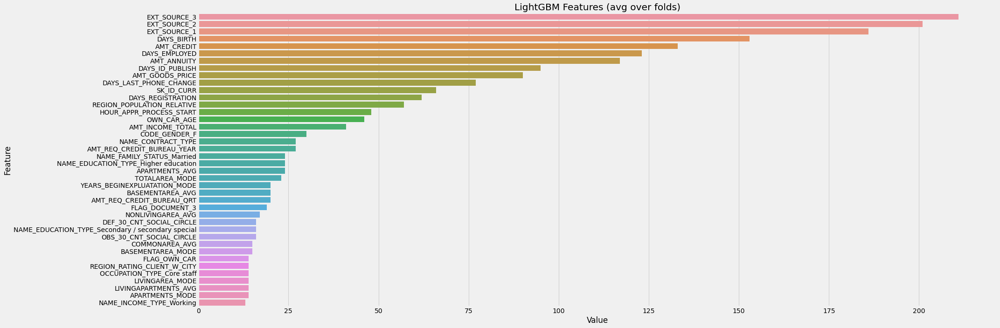

<Figure size 432x288 with 0 Axes>

In [151]:
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


def Feature_Interpretability (model, X_train, y_train): 
    model.fit(X_train, y_train) 
    feature_imp = pd.DataFrame(sorted(zip(model.feature_importances_,features)), columns=['Value','Feature'])
    #plt.figure(figsize=(20, 10))

    plt.figure(figsize=(30, 10))
    sns.barplot(x="Value", y="Feature", data=feature_imp.sort_values(by="Value", ascending=False).head(40))
    plt.title('LightGBM Features (avg over folds)')
    plt.tight_layout()
    plt.show()
    plt.savefig('lgbm_importances-01.png')
    
Feature_Interpretability (best_lgbm_cw, X_train, y_train)

Si on récupère le résultat du `feature importance` après l'ajout de nos propres variables (résultats du notebook secondaire) et illustré dans la figure ci-après, on remarques que la nouvelle variable `CREDIT_ANNUITY_RATIO` est la variable qui contribue le plus fortement au payement ou non du crédit, puis viennent `EXT_SOURCE_3` et `EXT_SOURCE_2`. `CREDIT_GOODS_PRICE_RATIO` et `CREDIT_DOWNPAYMENT` viennent s’immiscer parmi les variables originelles de la base au rangs 9 et 19. `AGE_INT` est absolument loin du compte visiblement.

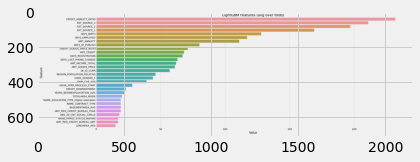

In [291]:
# read the image
img = plt.imread('lgbm_importances-01.jpg')
# show the image
plt.imshow(img)
plt.show()



### II- Interprétabilité des modèles avec lime
Nous allons en ce qui suit utiliser le package LIME pour expliquer et interpreter les variables des modèles avec les meilleurs hyperparamètres en utilisant la pondération.

In [72]:
import lime
import lime.lime_tabular

In [145]:
def LIME_Interpretability (model, X_train, y_train, choosen_instance): 
    model.fit(X_train, y_train) 
    
    # Create the Explainer
    ## Create a lambda function for each classifier that will return the predicted probability for the target variable 
    predict_fn_model = lambda x: model.predict_proba(x).astype(float)# ne marche pas sinon

    #predict_fn_rf = lambda x: rfc_cw.predict(x).astype(float) 
    explainer = lime.lime_tabular.LimeTabularExplainer(X_train,feature_names = features, class_names=['Will pay loan', 'Will not pay loan'],kernel_width=5)
    
    # Use the explainer to explain predictions
    exp = explainer.explain_instance(choosen_instance, predict_fn_model,num_features=10)
    exp.show_in_notebook(show_all=False)
    exp.as_pyplot_figure()

In [100]:
choosen_instance = X_test[421]

best_logit_cw = LogisticRegression( C= 0.1 , solver="liblinear", class_weight="balanced")
best_rfc_cw = RandomForestClassifier( criterion= 'entropy', max_depth= 10, n_estimators= 100, class_weight="balanced")
best_dtc_cw = DecisionTreeClassifier( criterion = 'entropy', max_depth= 8, class_weight="balanced")
best_xgb_cw = XGBClassifier(max_depth= 5, min_child_weight= 3, class_weight="balanced")
best_lgbm_cw = LGBMClassifier(boosting_type= 'goss', max_depth = 5, n_estimators= 100, class_weight="balanced" )



Sélectionner LGBM Classifier pour l'interprétation d'un résultat ( le meilleur modèle avec ou sans l'ajout des variables). 

#### - LGBM Classifier

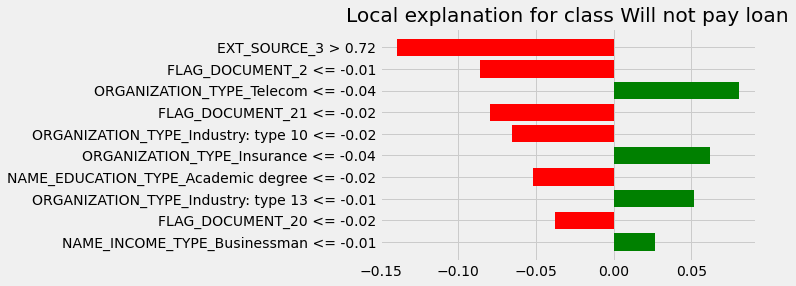

In [94]:
# Get the explanation for LGBM Classifier
LIME_Interpretability (best_lgbm_cw, X_train, y_train, choosen_instance)

- Le modèle a prédit Will pay loan (va payer). Le plus grand effet est que EXT_SOURCE_3 > 0.72; Il a  considérablement diminué ses chances de non payement de crédit suivi par FLAG_DOCUMENT_2 avec une valeur inférieure à -0.01.

- L'ORGANIZATION_TYPE_Telecom, ORGANIZATION_TYPE_Insurance, ORGANIZATION_TYPE_Industry: type 13, suivis par NAME_INCOME_TYPE_Businessman ont diminué les chances de payer le crédit.

De manière générale, si on regarde pareillemment le résultat du reste des algorithmes (dans la section annexe), les valeurs de probabilité pour chaque classe sont différentes pour chaque algorithme car les poids des caractéristiques calculés par chaque algorithme sont différents. En fonction de la valeur réelle des caractéristiques d'un enregistrement particulier et des poids attribués à ces caractéristiques, l'algorithme calcule la probabilité de la classe, puis prédit la classe ayant la probabilité la plus élevée. 

# Conclusions et perspectives:

<B>Conclusion:</B>

Tout au long de ce projet, nous avons pu passer en revue les modèles de machine learning, de les comparer et d'interpréter les modèles retenus. 

Les stratégies suivantes ont montré leurs importances lors de l'amélioration des prédictions:   

- Choix de variables ( généralement plus de variables pour obtenir de meilleurs scores).   

- Création d'une métrique en lien avec le besoin métier.

- Gestion du problème du déséquilibre des classes (Pondération des classes avec class_weights).  

- Choix du bon algorithme.

- l'optimisation des modèles a également été améliorée notamment en mettant en place une validation croisée (cross validation) pour éviter le sur-apprentissage.  

- Recherche des hyperparamètrees (Gridsearch)  

<B> Améliorations:</B>


1- Pour améliorer cette étude, il serait judicieux d'utiliser d’autres fichiers csv fournis par HomeCredit. Cela peut entraîner de meilleurs scores. 

2- Essayer plus de paramètres et une meilleure préparation des données (variables pertinentes, feature engineering) pour obtenir plus de résultats avec ces algorithmes.

3- Appliquer une technique d'augmentation de données.


#  Annexe : Résultats d'interprétabilité 

#### - XG Boost Classifier
- Le modèle a prédit Will pay loan (va payer). Les six plus grands effets sont ORGANIZATION_TYPE_Religion, EXT_SOURCE_3, EXT_SOURCE_2, NAME_TYPE_SUITE_Group of people, ORGANIZATION_TYPE_Transport: type 1 et ORGANIZATION_TYPE_Trade: type 4. Ils ont considérablement diminuéé ses chances de non payement de crédit. 

- Seul ORGANIZATION_TYPE_Cleaning avec une valeur inférieur -0.03 a augmenté les chances de non payement de crédit.

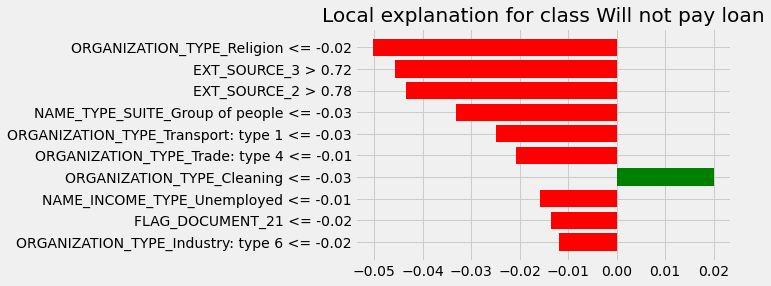

In [134]:
# Get the explanation for XGB Classifier
LIME_Interpretability (best_xgb_cw, X_train, y_train, choosen_instance)

#### - Logistic Regression

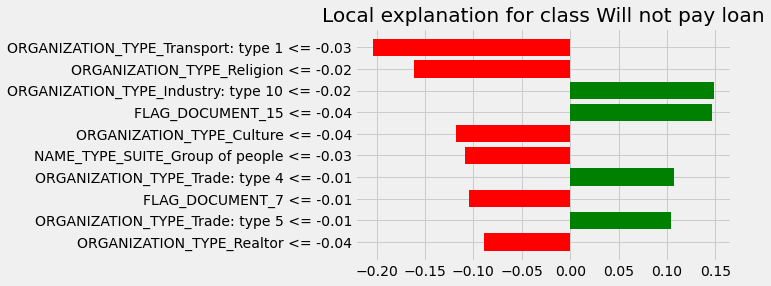

In [101]:
# Get the explanation for Logistic Regression
LIME_Interpretability (best_logit_cw, X_train, y_train, choosen_instance)

#### - Random Forest Classifier

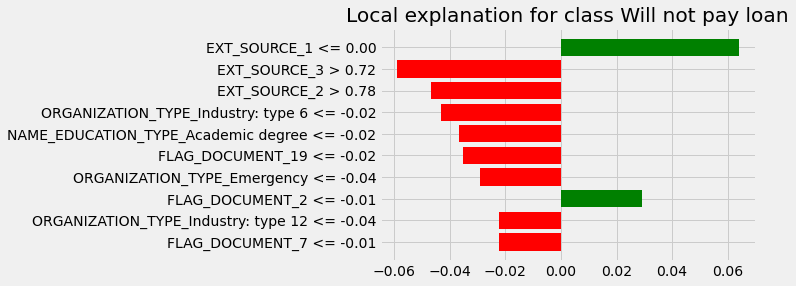

In [98]:
# Get the explanation for Random Forest
LIME_Interpretability (best_rfc_cw, X_train, y_train, choosen_instance)

#### - Decision Tree Classifier

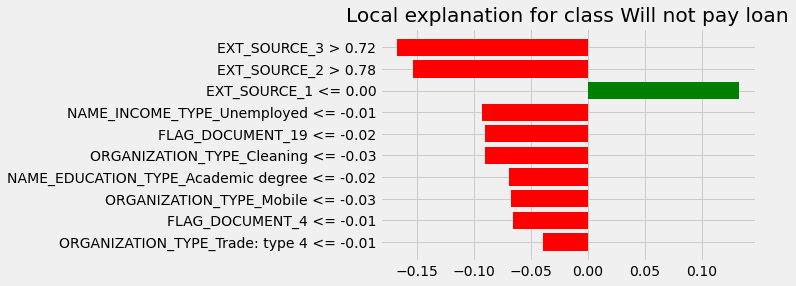

In [93]:
# Get the explanation for Decision Tree
LIME_Interpretability (best_dtc_cw, X_train, y_train, choosen_instance)